# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [1]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [2]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

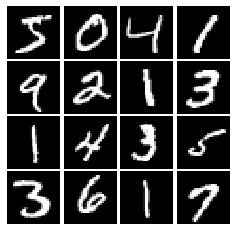

In [3]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [4]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    output = tf.maximum(alpha*x, x)
    return output

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [5]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [6]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    out = tf.random.uniform(maxval = 1, minval = -1, shape=[batch_size, dim])
    
    return out

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [7]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [8]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.InputLayer(784),
        
        tf.keras.layers.Dense(units=256, activation=leaky_relu),
        tf.keras.layers.Dense(units=256, activation=leaky_relu),
        tf.keras.layers.Dense(units=1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [9]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [10]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.InputLayer(noise_dim),
        
        tf.keras.layers.Dense(units=1024, activation = tf.nn.relu),
        tf.keras.layers.Dense(units=1024, activation = tf.nn.relu),
        tf.keras.layers.Dense(units=784, activation = tf.nn.tanh)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [11]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [12]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    bce = tf.keras.losses.BinaryCrossentropy(from_logits = True)
    
    true_labels_real = tf.ones_like(logits_real)
    true_labels_fake = tf.zeros_like(logits_fake)
    
    real_loss = bce(true_labels_real, logits_real)
    fake_loss = bce(true_labels_fake, logits_fake)
    
    l = real_loss + fake_loss
    
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return l

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    bce = tf.keras.losses.BinaryCrossentropy(from_logits = True)
    
    true_labels = tf.ones_like(logits_fake)
    loss = tf.nn.sigmoid_cross_entropy_with_logits(true_labels, logits_fake)
    
    # Average generator loss over the batch.
    loss = tf.reduce_mean(loss)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [13]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))


test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 3.97058e-09


In [14]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 7.19722e-17


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [15]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_solver = tf.keras.optimizers.Adam(learning_rate = learning_rate, beta_1 = beta1)
    G_solver = tf.keras.optimizers.Adam(learning_rate = learning_rate, beta_1 = beta1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [16]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(x.shape[0], noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [x.shape[0], 784]))
#                 if logits_real.shape != logits_fake.shape:
#                     import pdb; pdb.set_trace()
                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(x.shape[0], noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [x.shape[0], 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.25, G:0.6897
Instructions for updating:
Use tf.identity instead.


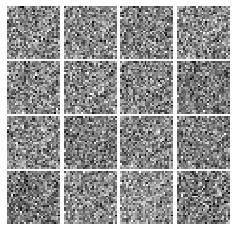

Epoch: 0, Iter: 20, D: 0.546, G:1.17


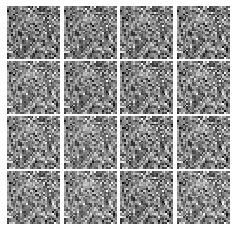

Epoch: 0, Iter: 40, D: 0.5298, G:1.113


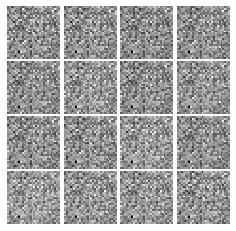

Epoch: 0, Iter: 60, D: 2.015, G:0.2861


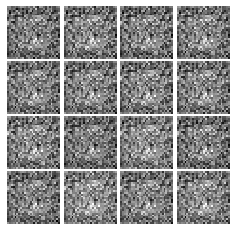

Epoch: 0, Iter: 80, D: 1.228, G:1.233


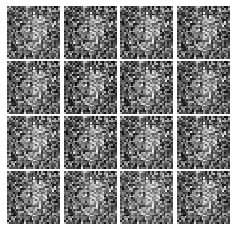

Epoch: 0, Iter: 100, D: 1.685, G:1.603


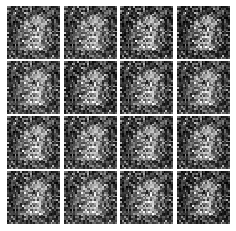

Epoch: 0, Iter: 120, D: 0.9939, G:1.726


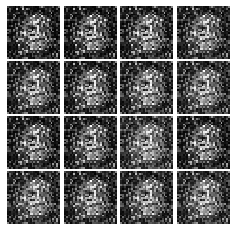

Epoch: 0, Iter: 140, D: 1.249, G:1.318


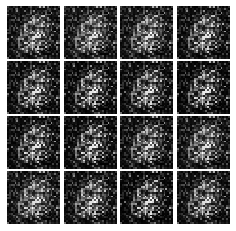

Epoch: 0, Iter: 160, D: 1.372, G:1.687


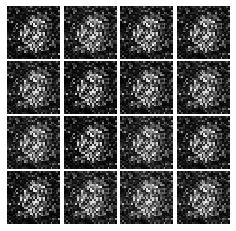

Epoch: 0, Iter: 180, D: 1.375, G:1.855


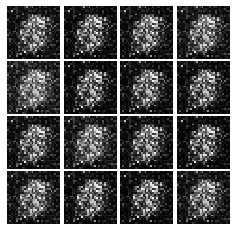

Epoch: 0, Iter: 200, D: 1.363, G:0.9762


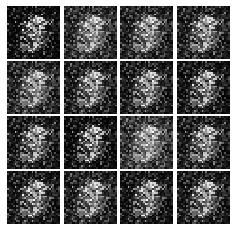

Epoch: 0, Iter: 220, D: 1.493, G:1.338


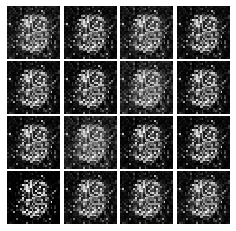

Epoch: 0, Iter: 240, D: 2.44, G:0.3186


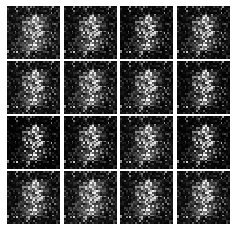

Epoch: 0, Iter: 260, D: 0.8161, G:1.931


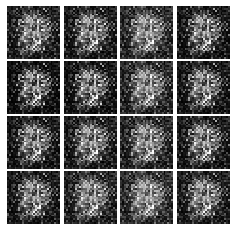

Epoch: 0, Iter: 280, D: 1.552, G:0.6396


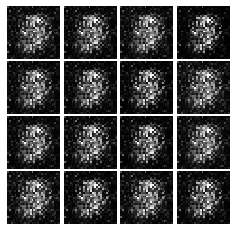

Epoch: 0, Iter: 300, D: 1.021, G:1.228


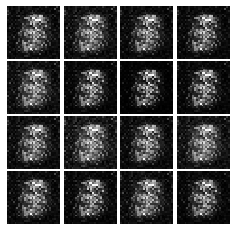

Epoch: 0, Iter: 320, D: 1.051, G:1.194


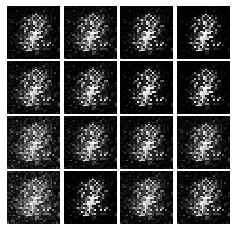

Epoch: 0, Iter: 340, D: 1.295, G:1.612


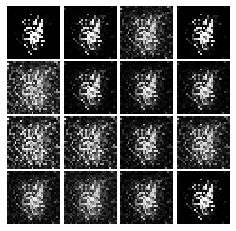

Epoch: 0, Iter: 360, D: 1.3, G:1.318


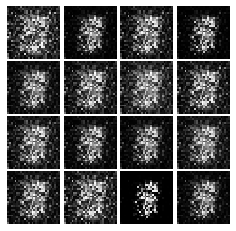

Epoch: 0, Iter: 380, D: 1.349, G:0.7268


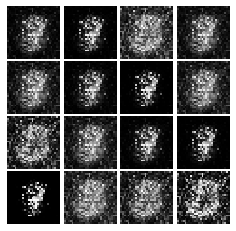

Epoch: 0, Iter: 400, D: 1.117, G:1.379


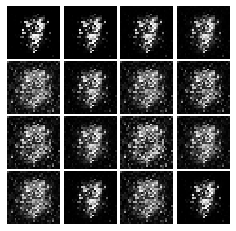

Epoch: 0, Iter: 420, D: 1.242, G:1.048


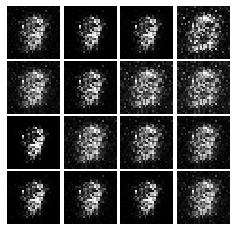

Epoch: 0, Iter: 440, D: 1.08, G:1.376


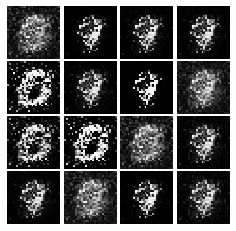

Epoch: 0, Iter: 460, D: 1.216, G:0.8722


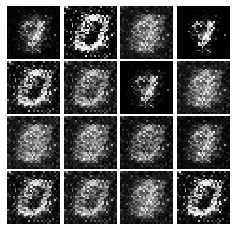

Epoch: 1, Iter: 480, D: 0.9561, G:1.858


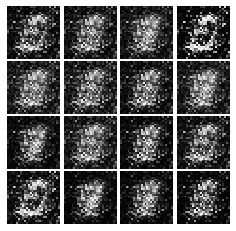

Epoch: 1, Iter: 500, D: 1.512, G:1.163


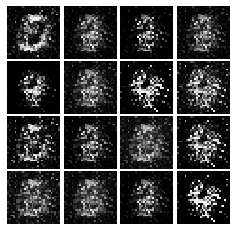

Epoch: 1, Iter: 520, D: 0.7439, G:1.775


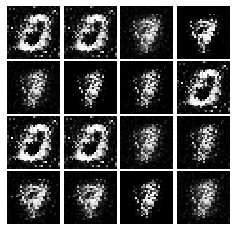

Epoch: 1, Iter: 540, D: 1.402, G:1.057


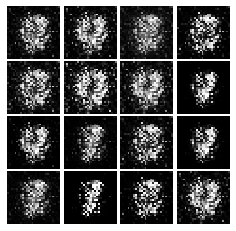

Epoch: 1, Iter: 560, D: 1.93, G:0.2208


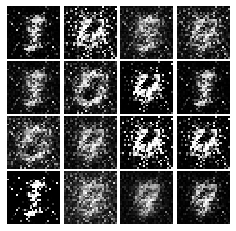

Epoch: 1, Iter: 580, D: 1.237, G:1.476


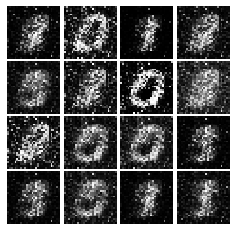

Epoch: 1, Iter: 600, D: 1.294, G:1.271


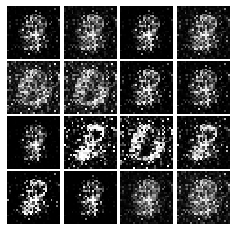

Epoch: 1, Iter: 620, D: 1.141, G:1.204


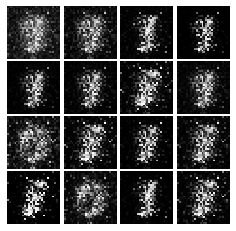

Epoch: 1, Iter: 640, D: 1.06, G:1.379


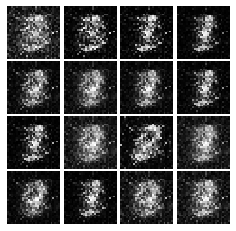

Epoch: 1, Iter: 660, D: 1.159, G:1.007


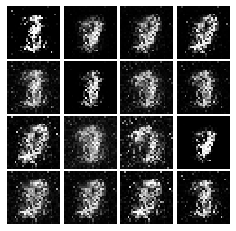

Epoch: 1, Iter: 680, D: 1.413, G:1.319


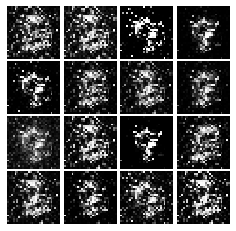

Epoch: 1, Iter: 700, D: 1.22, G:0.8832


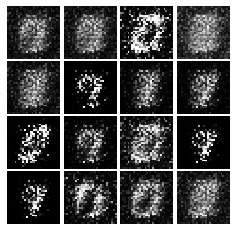

Epoch: 1, Iter: 720, D: 1.196, G:1.414


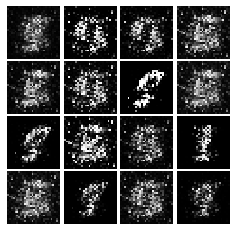

Epoch: 1, Iter: 740, D: 1.131, G:1.374


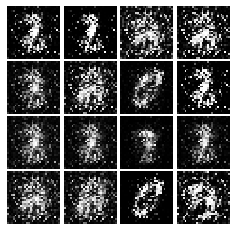

Epoch: 1, Iter: 760, D: 1.3, G:1.698


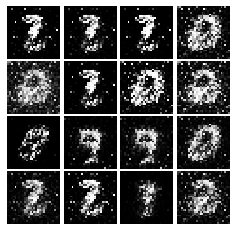

Epoch: 1, Iter: 780, D: 1.001, G:1.479


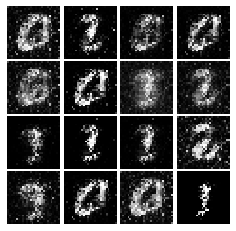

Epoch: 1, Iter: 800, D: 1.113, G:2.227


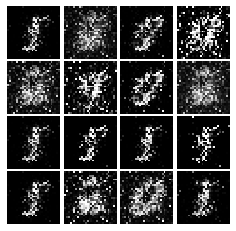

Epoch: 1, Iter: 820, D: 1.154, G:1.469


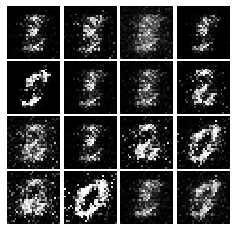

Epoch: 1, Iter: 840, D: 1.003, G:1.327


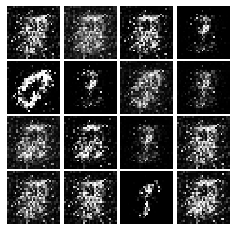

Epoch: 1, Iter: 860, D: 1.073, G:1.217


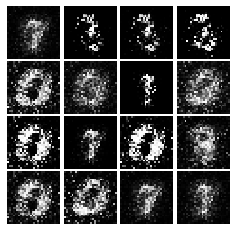

Epoch: 1, Iter: 880, D: 1.119, G:1.438


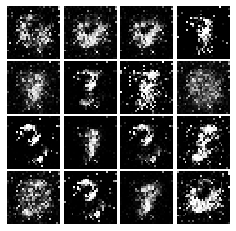

Epoch: 1, Iter: 900, D: 1.191, G:1.495


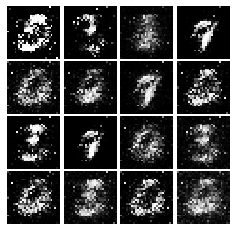

Epoch: 1, Iter: 920, D: 1.351, G:1.035


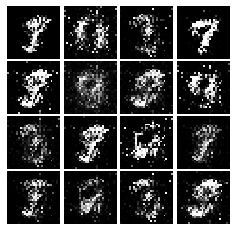

Epoch: 2, Iter: 940, D: 1.196, G:1.03


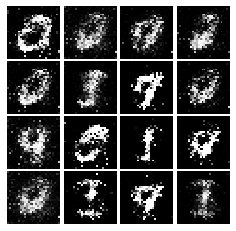

Epoch: 2, Iter: 960, D: 1.109, G:1.089


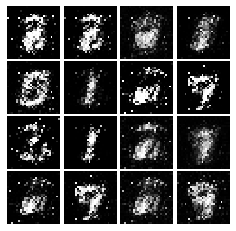

Epoch: 2, Iter: 980, D: 0.9793, G:1.232


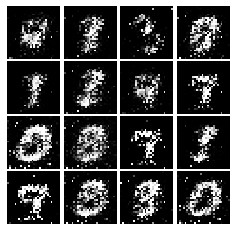

Epoch: 2, Iter: 1000, D: 1.228, G:1.307


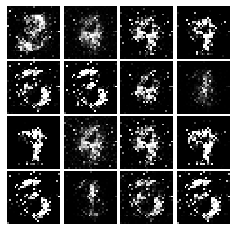

Epoch: 2, Iter: 1020, D: 0.9603, G:1.321


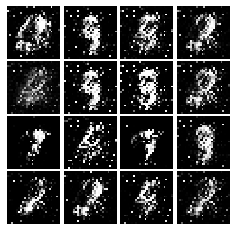

Epoch: 2, Iter: 1040, D: 1.524, G:1.434


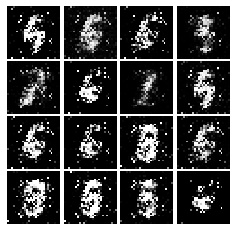

Epoch: 2, Iter: 1060, D: 0.9756, G:1.389


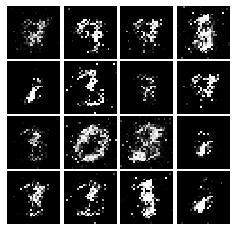

Epoch: 2, Iter: 1080, D: 1.289, G:1.242


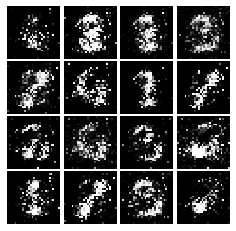

Epoch: 2, Iter: 1100, D: 1.195, G:1.221


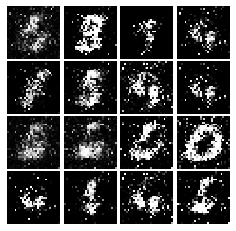

Epoch: 2, Iter: 1120, D: 1.278, G:1.042


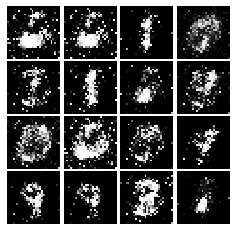

Epoch: 2, Iter: 1140, D: 1.253, G:0.7433


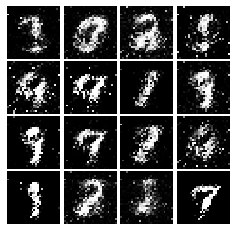

Epoch: 2, Iter: 1160, D: 1.123, G:1.108


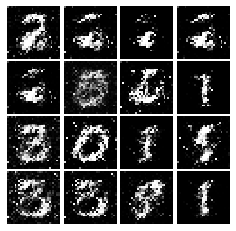

Epoch: 2, Iter: 1180, D: 1.425, G:1.311


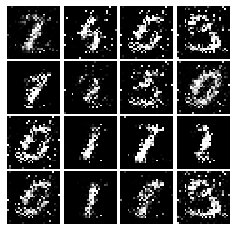

Epoch: 2, Iter: 1200, D: 1.174, G:1.151


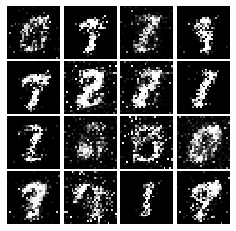

Epoch: 2, Iter: 1220, D: 1.272, G:1.33


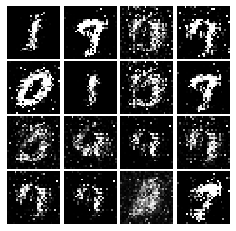

Epoch: 2, Iter: 1240, D: 1.042, G:1.175


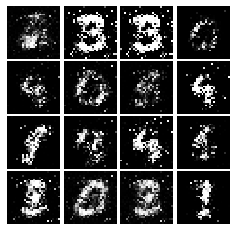

Epoch: 2, Iter: 1260, D: 1.401, G:0.8546


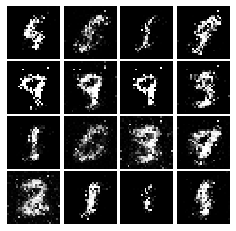

Epoch: 2, Iter: 1280, D: 1.231, G:0.9872


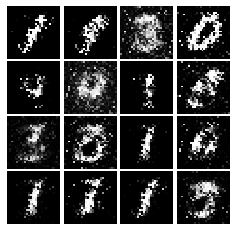

Epoch: 2, Iter: 1300, D: 1.239, G:0.9003


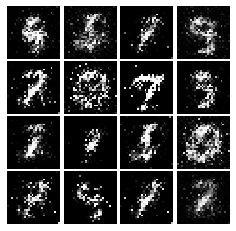

Epoch: 2, Iter: 1320, D: 1.33, G:1.017


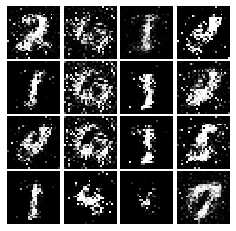

Epoch: 2, Iter: 1340, D: 1.288, G:1.23


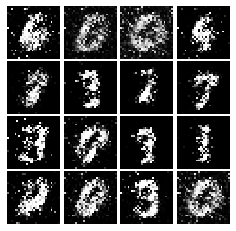

Epoch: 2, Iter: 1360, D: 1.28, G:1.364


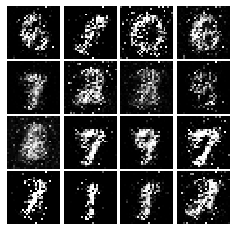

Epoch: 2, Iter: 1380, D: 1.111, G:1.181


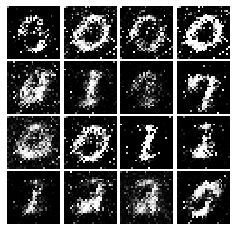

Epoch: 2, Iter: 1400, D: 1.27, G:0.9831


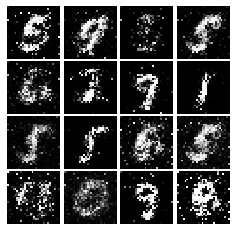

Epoch: 3, Iter: 1420, D: 1.142, G:0.9494


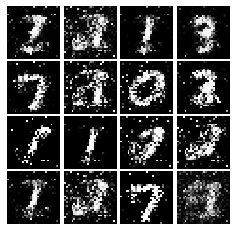

Epoch: 3, Iter: 1440, D: 1.136, G:1.124


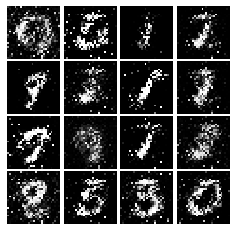

Epoch: 3, Iter: 1460, D: 1.189, G:1.369


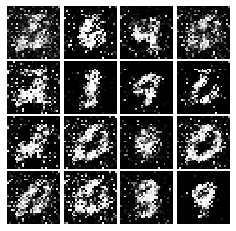

Epoch: 3, Iter: 1480, D: 1.28, G:1.077


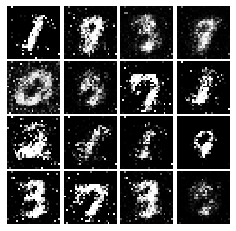

Epoch: 3, Iter: 1500, D: 1.227, G:1.017


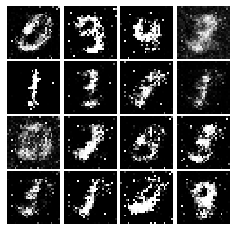

Epoch: 3, Iter: 1520, D: 1.209, G:0.8984


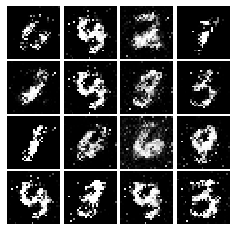

Epoch: 3, Iter: 1540, D: 1.143, G:0.5933


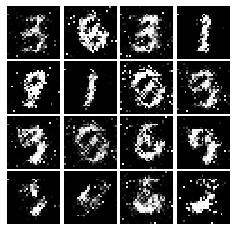

Epoch: 3, Iter: 1560, D: 1.213, G:0.8327


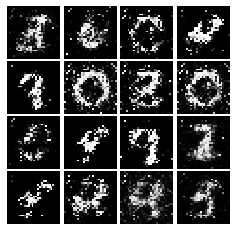

Epoch: 3, Iter: 1580, D: 1.108, G:0.8649


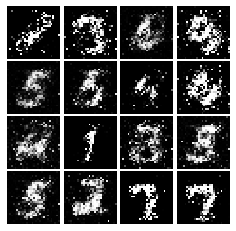

Epoch: 3, Iter: 1600, D: 1.231, G:0.8124


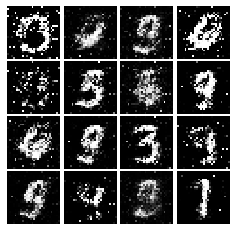

Epoch: 3, Iter: 1620, D: 1.254, G:0.7895


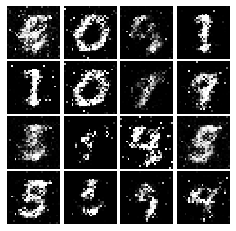

Epoch: 3, Iter: 1640, D: 1.281, G:0.8512


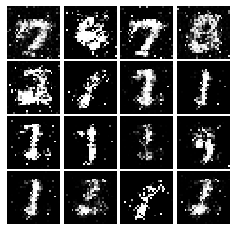

Epoch: 3, Iter: 1660, D: 1.258, G:1.032


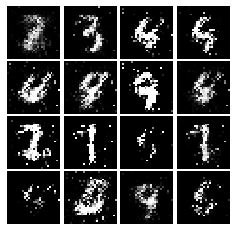

Epoch: 3, Iter: 1680, D: 1.286, G:0.9395


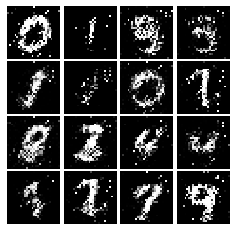

Epoch: 3, Iter: 1700, D: 1.401, G:0.7747


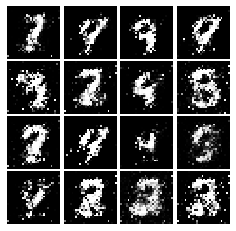

Epoch: 3, Iter: 1720, D: 1.312, G:0.8816


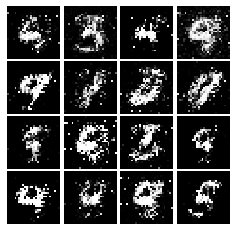

Epoch: 3, Iter: 1740, D: 1.259, G:0.8869


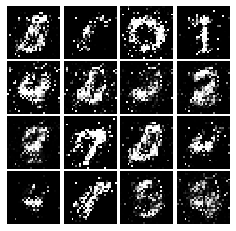

Epoch: 3, Iter: 1760, D: 1.114, G:1.042


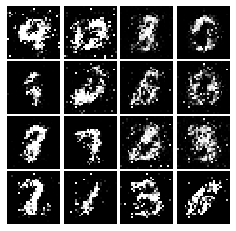

Epoch: 3, Iter: 1780, D: 1.364, G:1.215


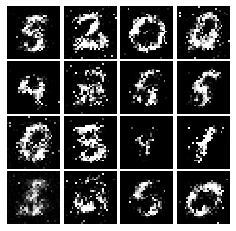

Epoch: 3, Iter: 1800, D: 1.375, G:0.8775


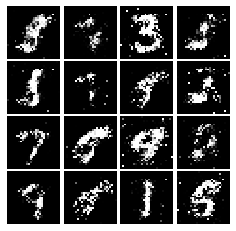

Epoch: 3, Iter: 1820, D: 1.186, G:0.8854


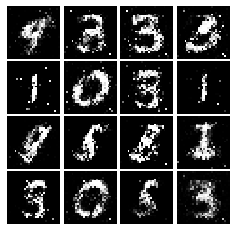

Epoch: 3, Iter: 1840, D: 1.232, G:0.9089


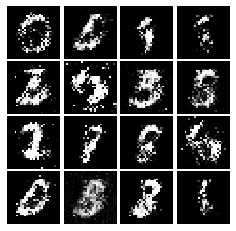

Epoch: 3, Iter: 1860, D: 1.286, G:0.8458


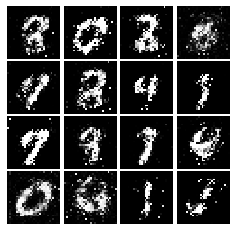

Epoch: 4, Iter: 1880, D: 1.26, G:0.7808


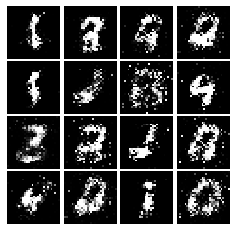

Epoch: 4, Iter: 1900, D: 1.208, G:0.9125


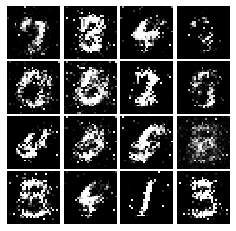

Epoch: 4, Iter: 1920, D: 1.19, G:1.061


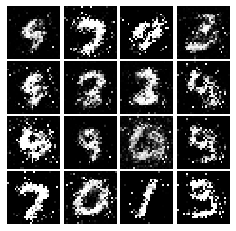

Epoch: 4, Iter: 1940, D: 1.32, G:0.8808


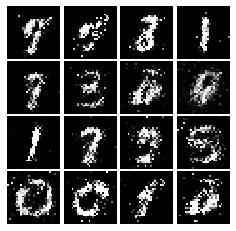

Epoch: 4, Iter: 1960, D: 1.257, G:1.105


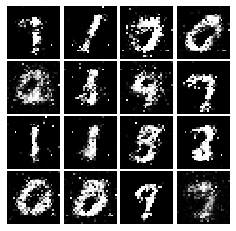

Epoch: 4, Iter: 1980, D: 1.232, G:2.026


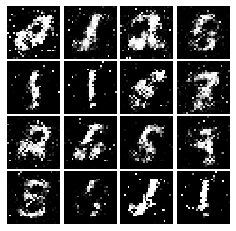

Epoch: 4, Iter: 2000, D: 1.284, G:0.938


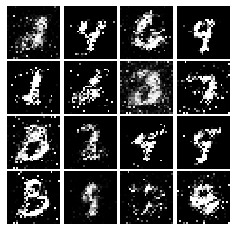

Epoch: 4, Iter: 2020, D: 1.327, G:0.7821


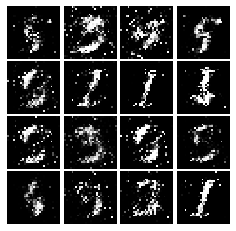

Epoch: 4, Iter: 2040, D: 1.25, G:0.9477


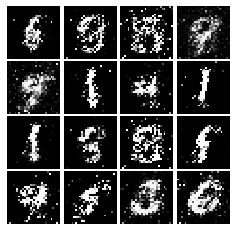

Epoch: 4, Iter: 2060, D: 1.417, G:0.8303


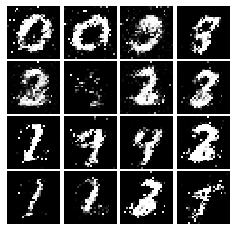

Epoch: 4, Iter: 2080, D: 1.309, G:0.9478


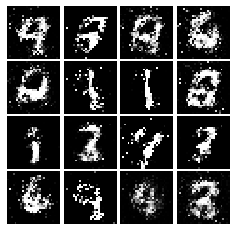

Epoch: 4, Iter: 2100, D: 1.267, G:0.887


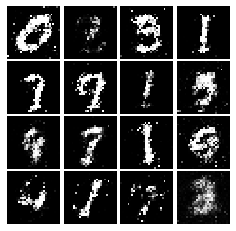

Epoch: 4, Iter: 2120, D: 1.228, G:0.9724


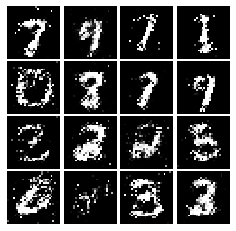

Epoch: 4, Iter: 2140, D: 1.276, G:0.8735


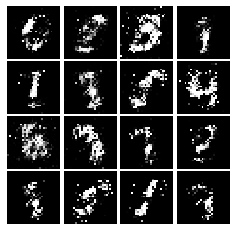

Epoch: 4, Iter: 2160, D: 1.36, G:0.804


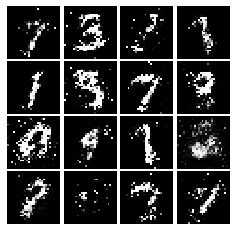

Epoch: 4, Iter: 2180, D: 1.417, G:0.9712


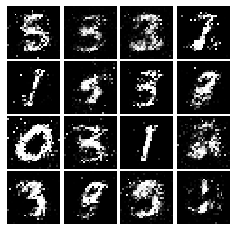

Epoch: 4, Iter: 2200, D: 1.239, G:0.8952


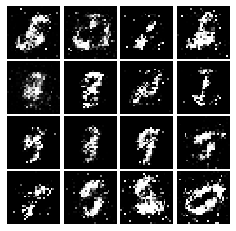

Epoch: 4, Iter: 2220, D: 1.309, G:0.8536


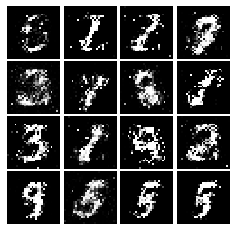

Epoch: 4, Iter: 2240, D: 1.352, G:0.858


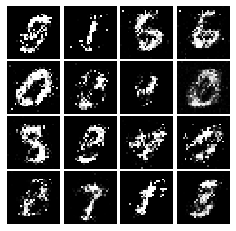

Epoch: 4, Iter: 2260, D: 1.253, G:0.9081


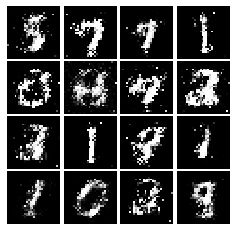

Epoch: 4, Iter: 2280, D: 1.253, G:0.8702


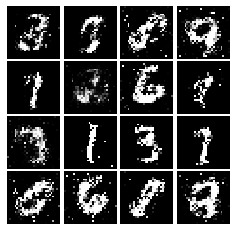

Epoch: 4, Iter: 2300, D: 1.186, G:0.893


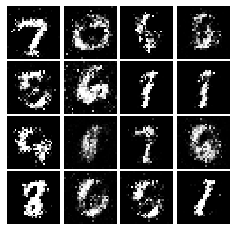

Epoch: 4, Iter: 2320, D: 1.193, G:0.7964


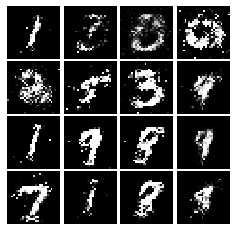

Epoch: 4, Iter: 2340, D: 1.044, G:0.9402


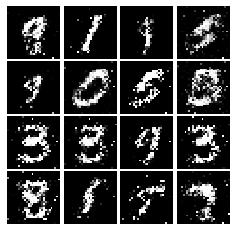

Epoch: 5, Iter: 2360, D: 1.379, G:0.8312


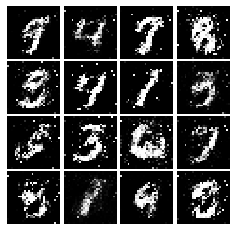

Epoch: 5, Iter: 2380, D: 1.295, G:0.8619


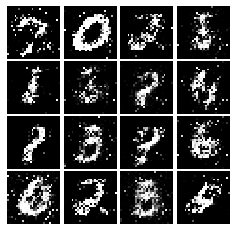

Epoch: 5, Iter: 2400, D: 1.308, G:0.8604


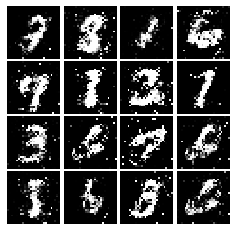

Epoch: 5, Iter: 2420, D: 1.271, G:0.9076


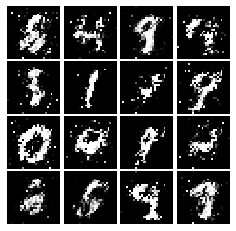

Epoch: 5, Iter: 2440, D: 1.292, G:1.313


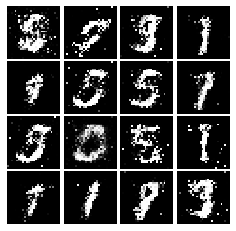

Epoch: 5, Iter: 2460, D: 1.138, G:1.133


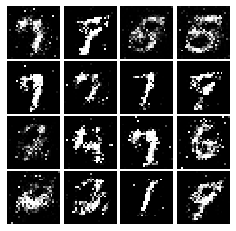

Epoch: 5, Iter: 2480, D: 1.241, G:0.7318


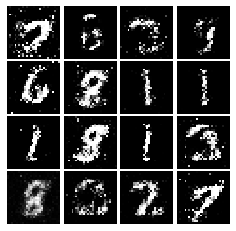

Epoch: 5, Iter: 2500, D: 1.225, G:0.8352


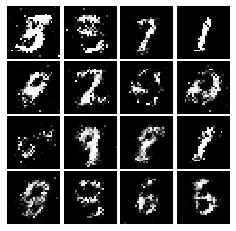

Epoch: 5, Iter: 2520, D: 1.471, G:0.8201


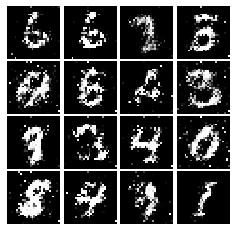

Epoch: 5, Iter: 2540, D: 1.411, G:0.9015


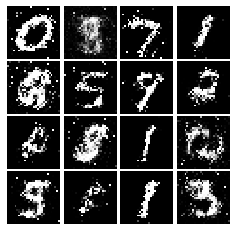

Epoch: 5, Iter: 2560, D: 1.369, G:0.8431


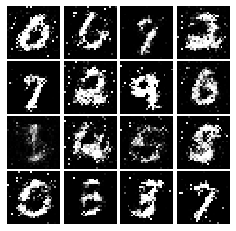

Epoch: 5, Iter: 2580, D: 1.263, G:0.8726


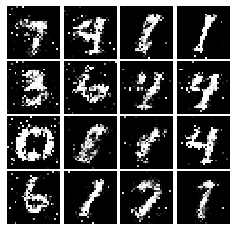

Epoch: 5, Iter: 2600, D: 1.43, G:0.8478


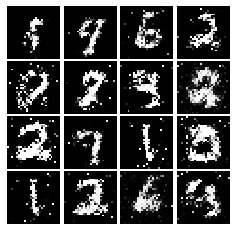

Epoch: 5, Iter: 2620, D: 1.334, G:0.8328


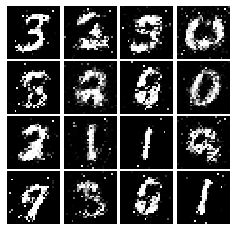

Epoch: 5, Iter: 2640, D: 1.352, G:0.7755


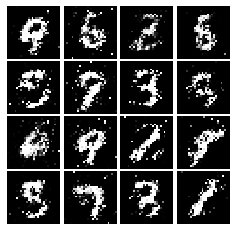

Epoch: 5, Iter: 2660, D: 1.284, G:0.8741


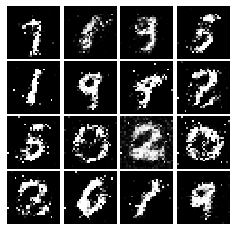

Epoch: 5, Iter: 2680, D: 1.387, G:0.8122


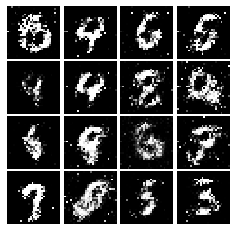

Epoch: 5, Iter: 2700, D: 1.299, G:0.7877


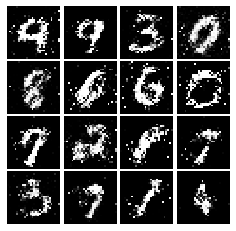

Epoch: 5, Iter: 2720, D: 1.444, G:0.955


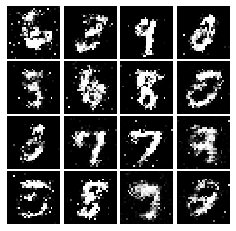

Epoch: 5, Iter: 2740, D: 1.299, G:0.8937


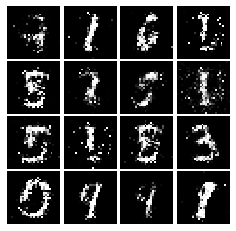

Epoch: 5, Iter: 2760, D: 1.323, G:0.9186


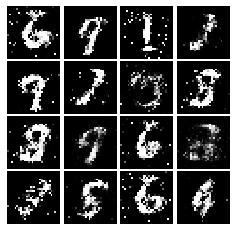

Epoch: 5, Iter: 2780, D: 1.306, G:0.8192


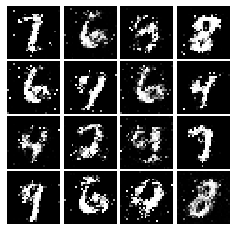

Epoch: 5, Iter: 2800, D: 1.245, G:0.8208


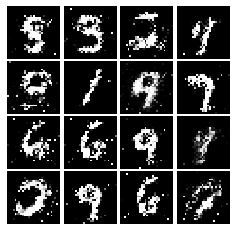

Epoch: 6, Iter: 2820, D: 1.269, G:0.8462


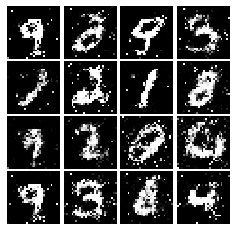

Epoch: 6, Iter: 2840, D: 1.295, G:0.7775


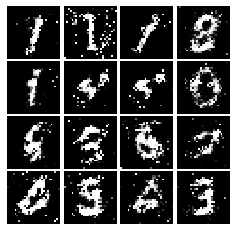

Epoch: 6, Iter: 2860, D: 1.307, G:0.8175


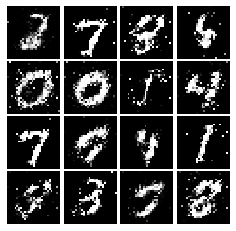

Epoch: 6, Iter: 2880, D: 1.055, G:1.059


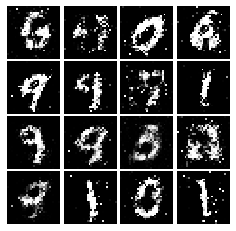

Epoch: 6, Iter: 2900, D: 1.257, G:0.9039


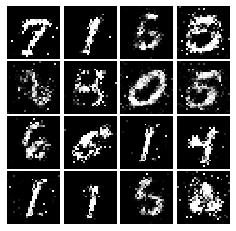

Epoch: 6, Iter: 2920, D: 1.394, G:0.736


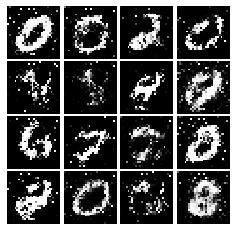

Epoch: 6, Iter: 2940, D: 1.293, G:0.7842


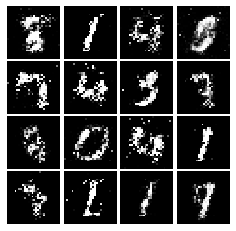

Epoch: 6, Iter: 2960, D: 1.3, G:0.799


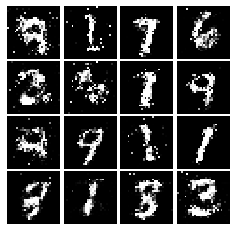

Epoch: 6, Iter: 2980, D: 1.313, G:0.8038


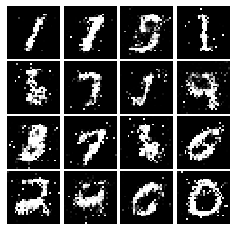

Epoch: 6, Iter: 3000, D: 1.506, G:0.6455


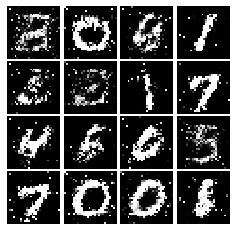

Epoch: 6, Iter: 3020, D: 1.311, G:0.8136


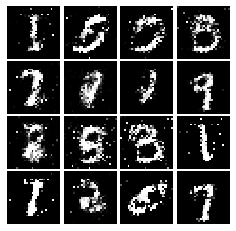

Epoch: 6, Iter: 3040, D: 1.25, G:0.8416


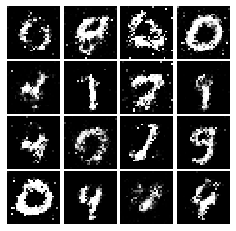

Epoch: 6, Iter: 3060, D: 1.297, G:0.8416


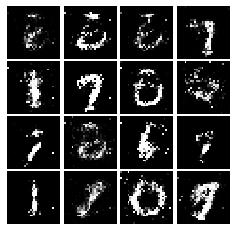

Epoch: 6, Iter: 3080, D: 1.252, G:0.8615


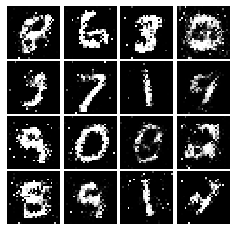

Epoch: 6, Iter: 3100, D: 1.138, G:0.8411


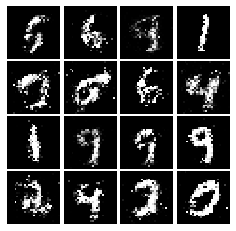

Epoch: 6, Iter: 3120, D: 1.288, G:0.8183


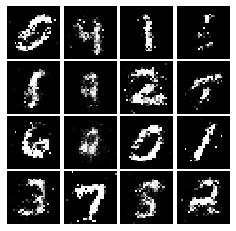

Epoch: 6, Iter: 3140, D: 1.266, G:0.885


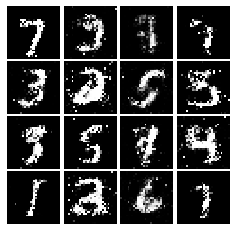

Epoch: 6, Iter: 3160, D: 1.339, G:0.995


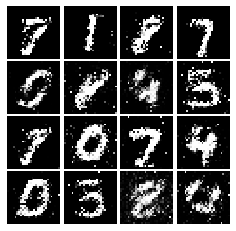

Epoch: 6, Iter: 3180, D: 1.383, G:0.8845


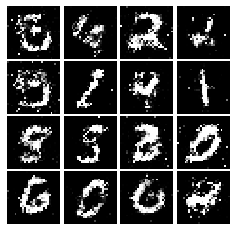

Epoch: 6, Iter: 3200, D: 1.36, G:0.9075


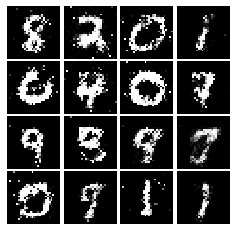

Epoch: 6, Iter: 3220, D: 1.265, G:0.8305


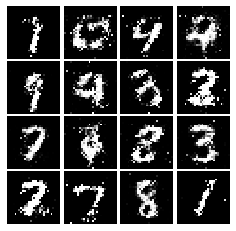

Epoch: 6, Iter: 3240, D: 1.32, G:0.841


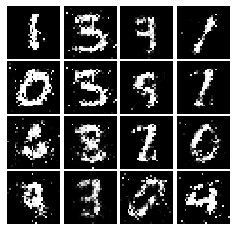

Epoch: 6, Iter: 3260, D: 1.346, G:0.8511


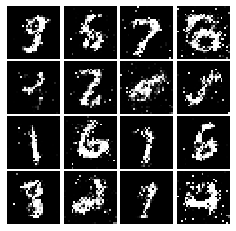

Epoch: 6, Iter: 3280, D: 1.257, G:0.9124


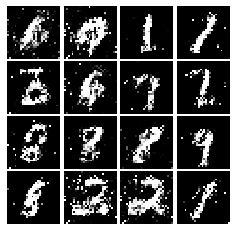

Epoch: 7, Iter: 3300, D: 1.251, G:0.8918


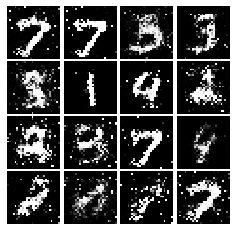

Epoch: 7, Iter: 3320, D: 1.276, G:0.8055


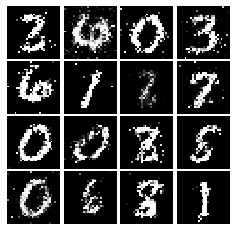

Epoch: 7, Iter: 3340, D: 1.426, G:1.178


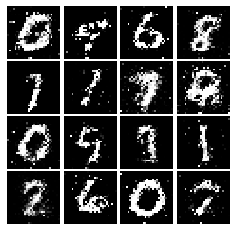

Epoch: 7, Iter: 3360, D: 1.379, G:0.6949


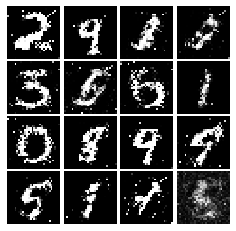

Epoch: 7, Iter: 3380, D: 1.273, G:0.8132


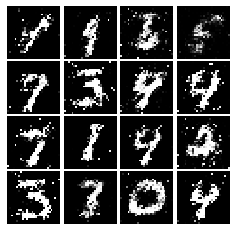

Epoch: 7, Iter: 3400, D: 1.423, G:0.9605


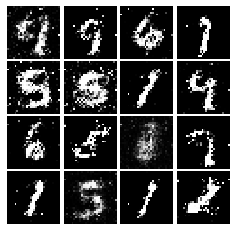

Epoch: 7, Iter: 3420, D: 1.233, G:1.022


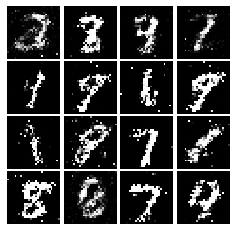

Epoch: 7, Iter: 3440, D: 1.31, G:1.011


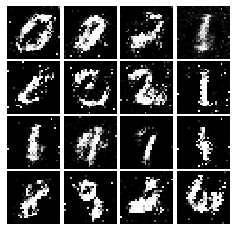

Epoch: 7, Iter: 3460, D: 1.309, G:0.8716


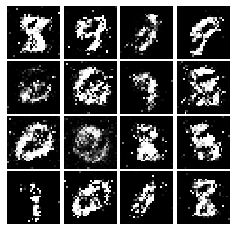

Epoch: 7, Iter: 3480, D: 1.262, G:0.783


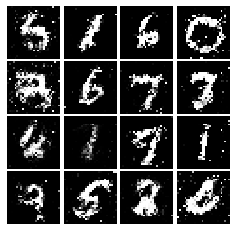

Epoch: 7, Iter: 3500, D: 1.321, G:0.8075


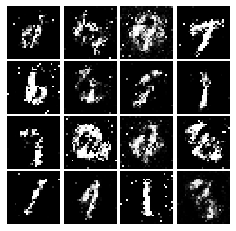

Epoch: 7, Iter: 3520, D: 1.257, G:0.801


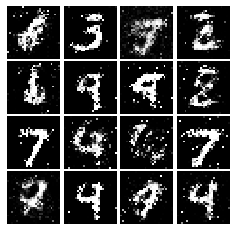

Epoch: 7, Iter: 3540, D: 1.323, G:0.7084


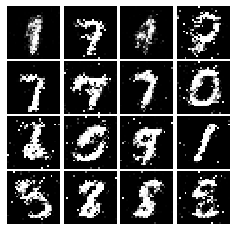

Epoch: 7, Iter: 3560, D: 1.215, G:0.7882


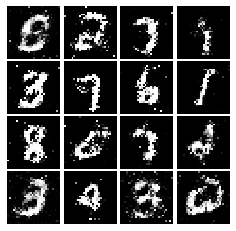

Epoch: 7, Iter: 3580, D: 1.311, G:0.8886


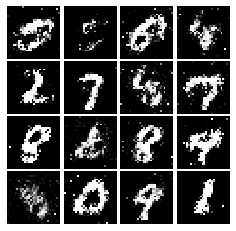

Epoch: 7, Iter: 3600, D: 1.39, G:0.7017


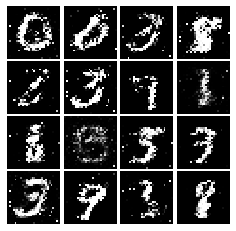

Epoch: 7, Iter: 3620, D: 1.28, G:0.885


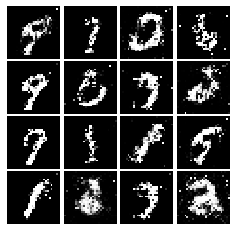

Epoch: 7, Iter: 3640, D: 1.38, G:0.8602


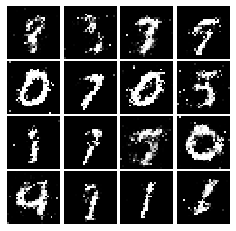

Epoch: 7, Iter: 3660, D: 1.286, G:0.748


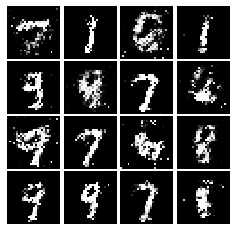

Epoch: 7, Iter: 3680, D: 1.294, G:0.853


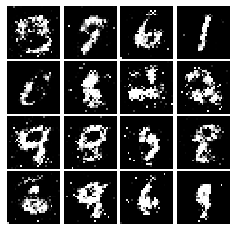

Epoch: 7, Iter: 3700, D: 1.283, G:0.8258


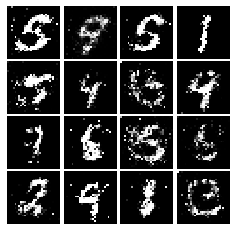

Epoch: 7, Iter: 3720, D: 1.32, G:0.8006


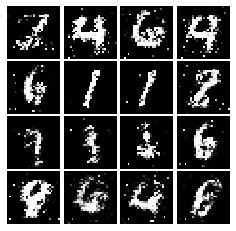

Epoch: 7, Iter: 3740, D: 1.363, G:0.7802


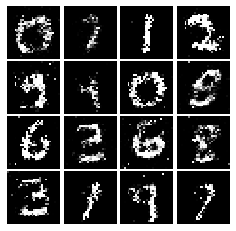

Epoch: 8, Iter: 3760, D: 1.288, G:0.913


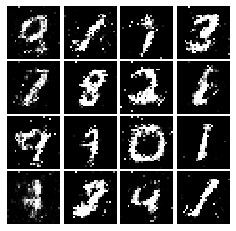

Epoch: 8, Iter: 3780, D: 1.338, G:0.8197


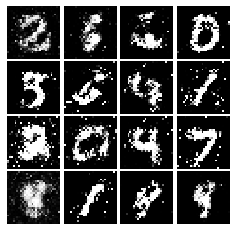

Epoch: 8, Iter: 3800, D: 1.275, G:0.7904


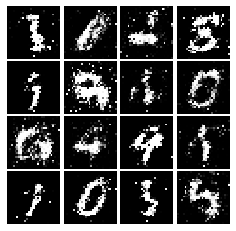

Epoch: 8, Iter: 3820, D: 1.319, G:0.8585


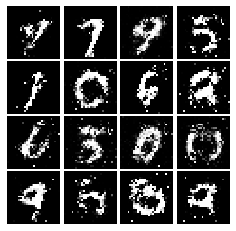

Epoch: 8, Iter: 3840, D: 1.383, G:0.8004


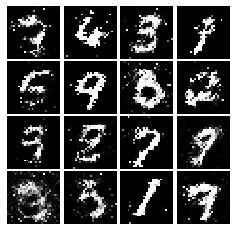

Epoch: 8, Iter: 3860, D: 1.318, G:0.8358


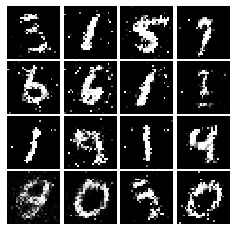

Epoch: 8, Iter: 3880, D: 1.349, G:0.7759


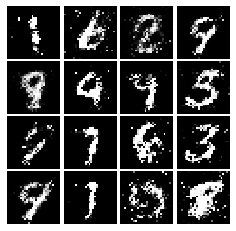

Epoch: 8, Iter: 3900, D: 1.354, G:0.8171


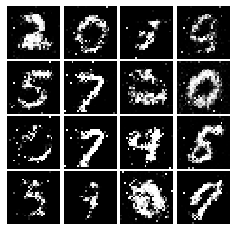

Epoch: 8, Iter: 3920, D: 1.316, G:0.8277


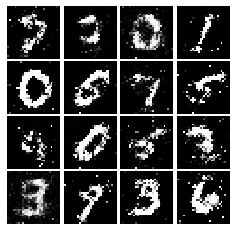

Epoch: 8, Iter: 3940, D: 1.344, G:0.7813


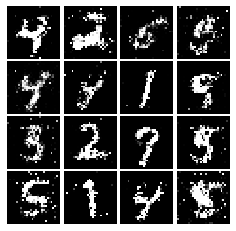

Epoch: 8, Iter: 3960, D: 1.313, G:0.7281


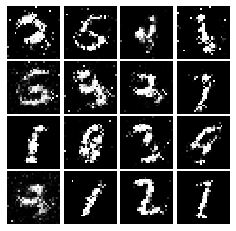

Epoch: 8, Iter: 3980, D: 1.372, G:0.8215


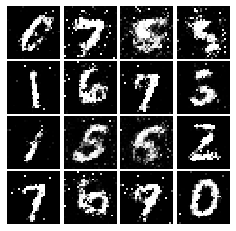

Epoch: 8, Iter: 4000, D: 1.302, G:0.8232


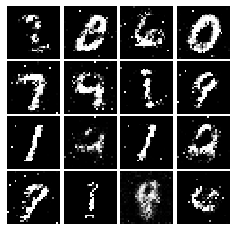

Epoch: 8, Iter: 4020, D: 1.294, G:0.7668


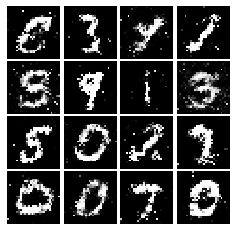

Epoch: 8, Iter: 4040, D: 1.296, G:0.8224


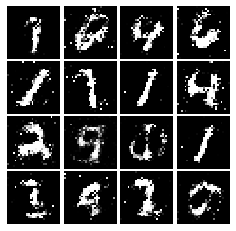

Epoch: 8, Iter: 4060, D: 1.26, G:0.7923


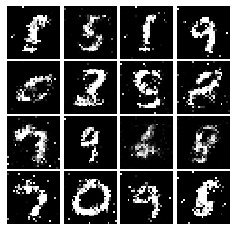

Epoch: 8, Iter: 4080, D: 1.352, G:0.8264


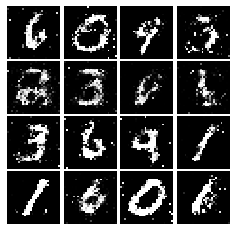

Epoch: 8, Iter: 4100, D: 1.262, G:0.8545


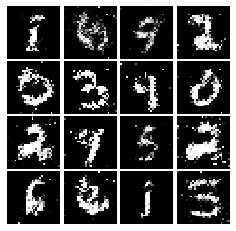

Epoch: 8, Iter: 4120, D: 1.377, G:0.8815


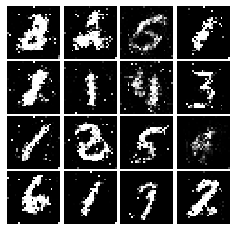

Epoch: 8, Iter: 4140, D: 1.358, G:0.918


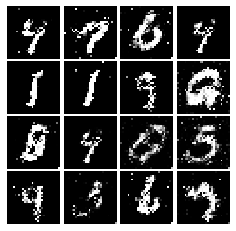

Epoch: 8, Iter: 4160, D: 1.337, G:0.8927


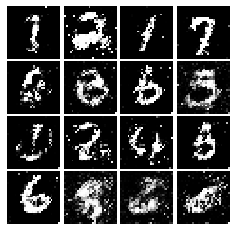

Epoch: 8, Iter: 4180, D: 1.368, G:0.7971


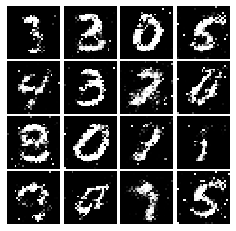

Epoch: 8, Iter: 4200, D: 1.306, G:0.8524


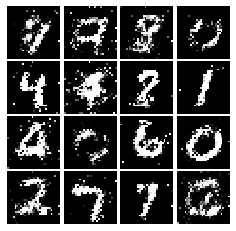

Epoch: 8, Iter: 4220, D: 1.48, G:0.7929


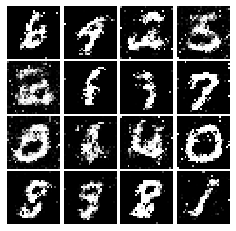

Epoch: 9, Iter: 4240, D: 1.314, G:0.8209


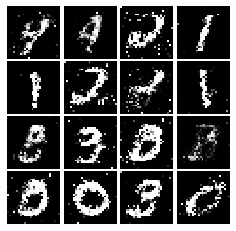

Epoch: 9, Iter: 4260, D: 1.386, G:0.7926


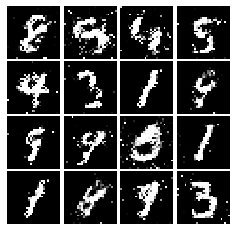

Epoch: 9, Iter: 4280, D: 1.358, G:0.8054


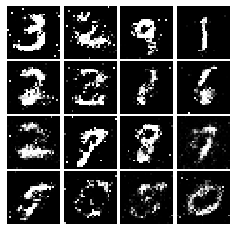

Epoch: 9, Iter: 4300, D: 1.416, G:0.7451


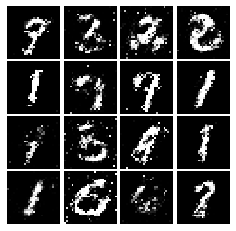

Epoch: 9, Iter: 4320, D: 1.398, G:0.8308


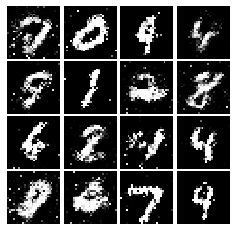

Epoch: 9, Iter: 4340, D: 1.314, G:0.8794


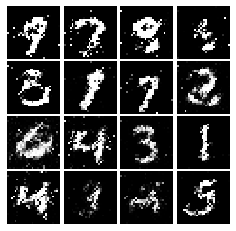

Epoch: 9, Iter: 4360, D: 1.377, G:0.9015


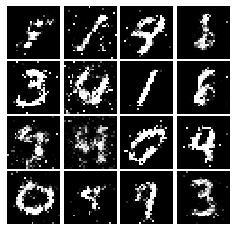

Epoch: 9, Iter: 4380, D: 1.561, G:0.8885


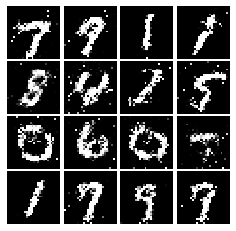

Epoch: 9, Iter: 4400, D: 1.247, G:0.9102


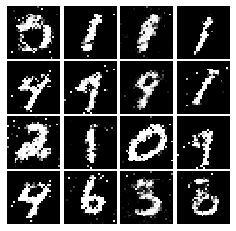

Epoch: 9, Iter: 4420, D: 1.259, G:0.7367


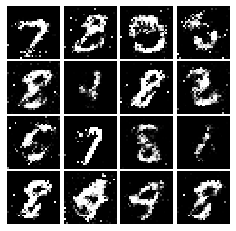

Epoch: 9, Iter: 4440, D: 1.33, G:0.7861


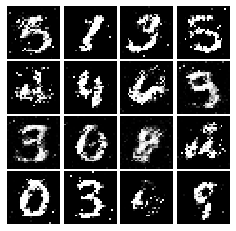

Epoch: 9, Iter: 4460, D: 1.297, G:0.8358


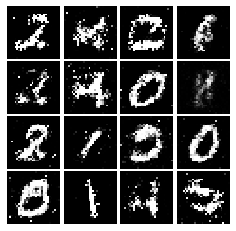

Epoch: 9, Iter: 4480, D: 1.321, G:0.7479


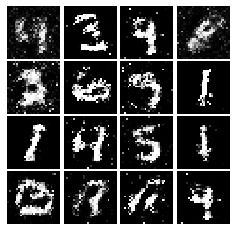

Epoch: 9, Iter: 4500, D: 1.406, G:0.8045


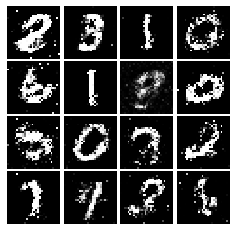

Epoch: 9, Iter: 4520, D: 1.329, G:0.829


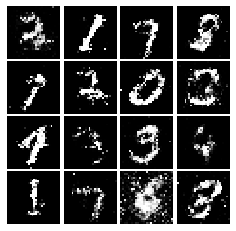

Epoch: 9, Iter: 4540, D: 1.281, G:0.7887


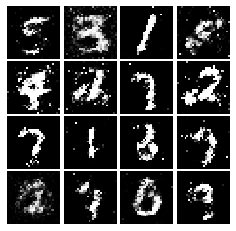

Epoch: 9, Iter: 4560, D: 1.305, G:0.8191


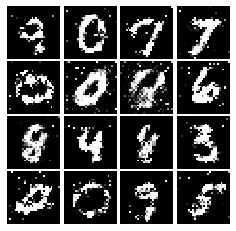

Epoch: 9, Iter: 4580, D: 1.348, G:0.8491


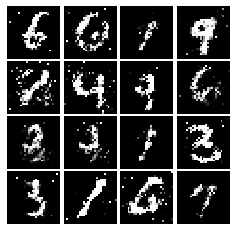

Epoch: 9, Iter: 4600, D: 1.316, G:0.8054


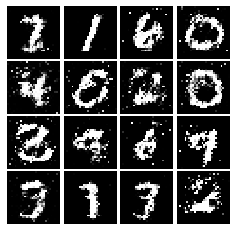

Epoch: 9, Iter: 4620, D: 1.329, G:0.8401


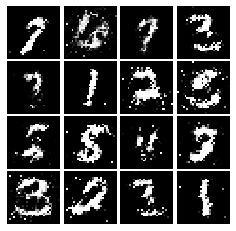

Epoch: 9, Iter: 4640, D: 1.337, G:0.835


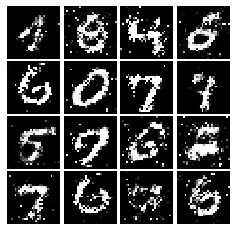

Epoch: 9, Iter: 4660, D: 1.323, G:0.8639


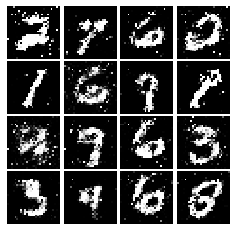

Epoch: 9, Iter: 4680, D: 1.34, G:0.7183


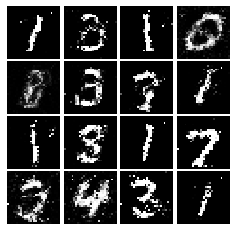

Final images


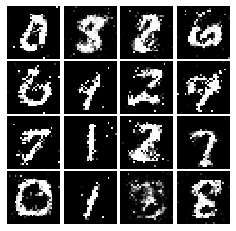

In [17]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [18]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    fake_image_loss = tf.reduce_mean((scores_real - 1)**2)
    real_image_loss = tf.reduce_mean(scores_fake**2)
    
    loss = 0.5*(fake_image_loss + real_image_loss)
    
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    loss = 0.5*tf.reduce_mean((scores_fake - 1)**2)


    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [19]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 1.626, G:0.3654


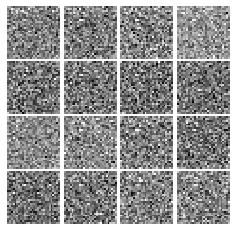

Epoch: 0, Iter: 20, D: 0.1312, G:1.236


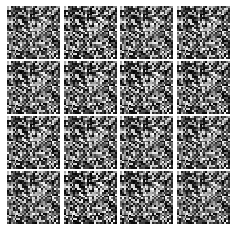

Epoch: 0, Iter: 40, D: 0.04606, G:0.5665


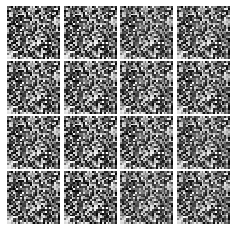

Epoch: 0, Iter: 60, D: 0.02974, G:0.6178


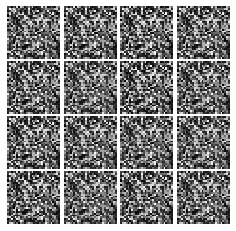

Epoch: 0, Iter: 80, D: 0.01838, G:0.8062


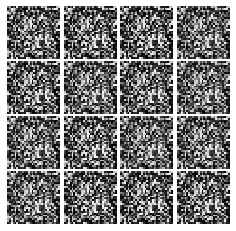

Epoch: 0, Iter: 100, D: 0.05342, G:0.4552


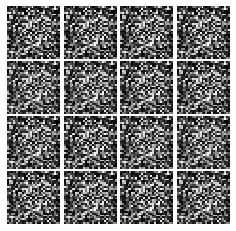

Epoch: 0, Iter: 120, D: 0.06873, G:0.3907


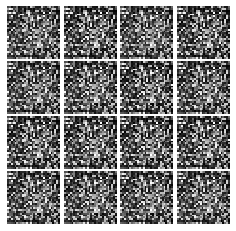

Epoch: 0, Iter: 140, D: 0.1309, G:0.534


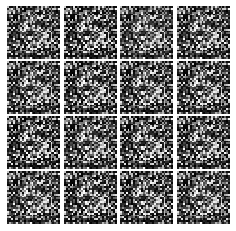

Epoch: 0, Iter: 160, D: 0.02621, G:0.3617


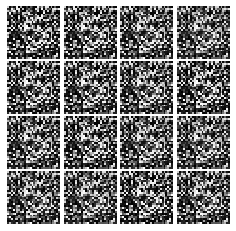

Epoch: 0, Iter: 180, D: 0.04063, G:1.076


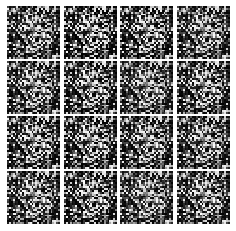

Epoch: 0, Iter: 200, D: 0.005506, G:0.5764


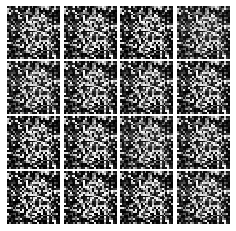

Epoch: 0, Iter: 220, D: 0.006688, G:0.5982


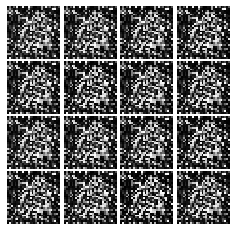

Epoch: 0, Iter: 240, D: 0.02715, G:0.5288


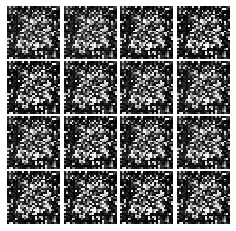

Epoch: 0, Iter: 260, D: 0.02826, G:1.053


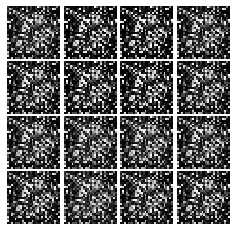

Epoch: 0, Iter: 280, D: 0.02511, G:0.3753


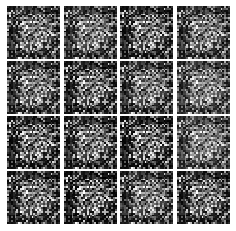

Epoch: 0, Iter: 300, D: 0.09892, G:0.4285


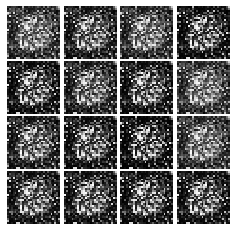

Epoch: 0, Iter: 320, D: 0.1506, G:0.866


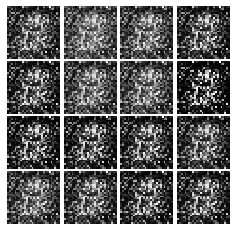

Epoch: 0, Iter: 340, D: 0.1202, G:0.455


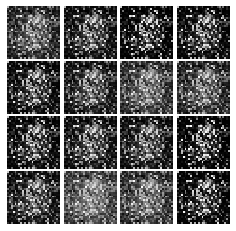

Epoch: 0, Iter: 360, D: 0.323, G:0.6054


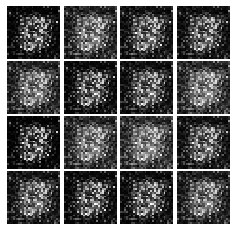

Epoch: 0, Iter: 380, D: 0.1924, G:0.6881


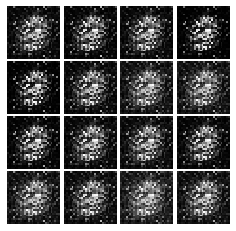

Epoch: 0, Iter: 400, D: 0.1612, G:0.5088


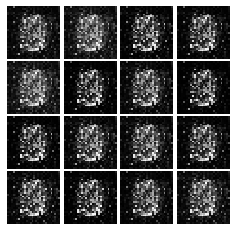

Epoch: 0, Iter: 420, D: 0.1159, G:0.457


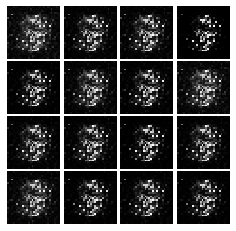

Epoch: 0, Iter: 440, D: 0.2071, G:0.1929


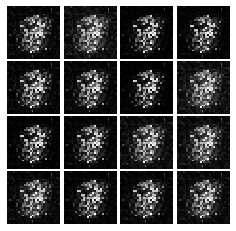

Epoch: 0, Iter: 460, D: 0.1768, G:0.3197


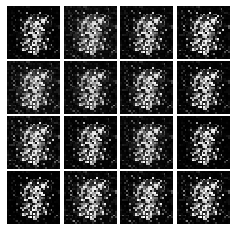

Epoch: 1, Iter: 480, D: 0.1571, G:0.3792


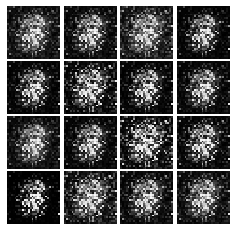

Epoch: 1, Iter: 500, D: 0.2622, G:0.6363


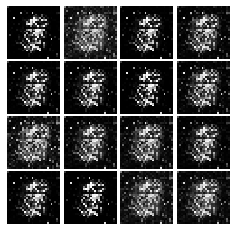

Epoch: 1, Iter: 520, D: 0.2221, G:0.1382


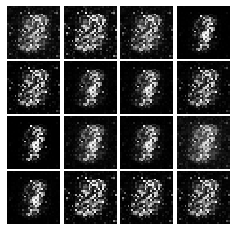

Epoch: 1, Iter: 540, D: 0.1029, G:0.4831


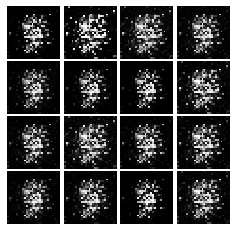

Epoch: 1, Iter: 560, D: 0.2975, G:0.2613


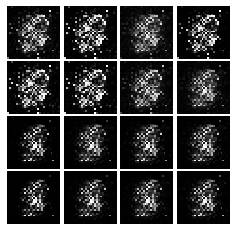

Epoch: 1, Iter: 580, D: 0.1147, G:0.4103


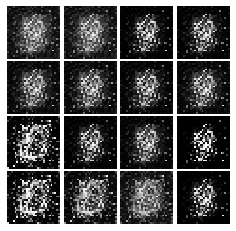

Epoch: 1, Iter: 600, D: 0.1754, G:0.2462


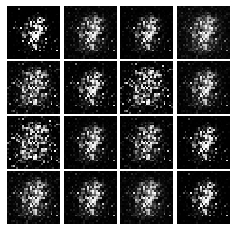

Epoch: 1, Iter: 620, D: 0.1428, G:0.1978


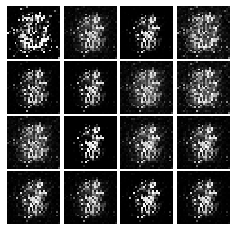

Epoch: 1, Iter: 640, D: 0.3069, G:0.3672


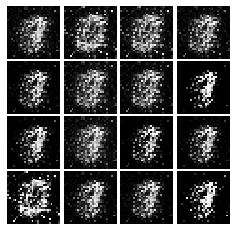

Epoch: 1, Iter: 660, D: 0.8515, G:0.1647


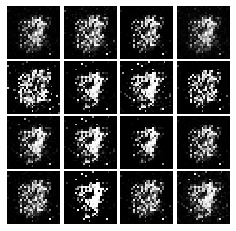

Epoch: 1, Iter: 680, D: 0.1672, G:0.2971


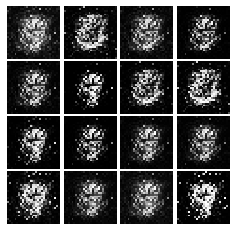

Epoch: 1, Iter: 700, D: 0.1732, G:0.2372


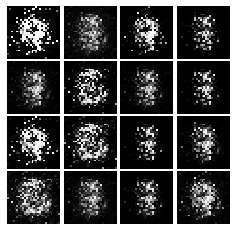

Epoch: 1, Iter: 720, D: 0.1786, G:0.3192


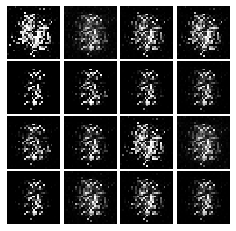

Epoch: 1, Iter: 740, D: 0.1525, G:0.2661


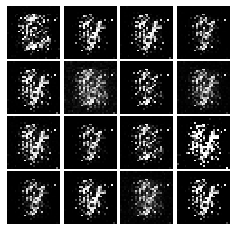

Epoch: 1, Iter: 760, D: 0.1646, G:0.2303


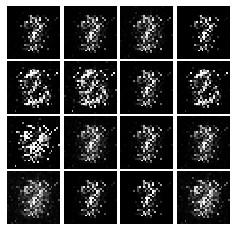

Epoch: 1, Iter: 780, D: 0.253, G:0.6154


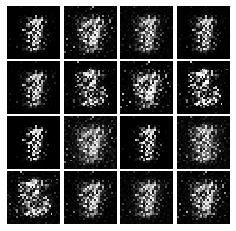

Epoch: 1, Iter: 800, D: 0.2062, G:0.3065


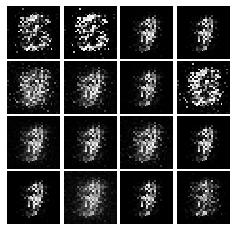

Epoch: 1, Iter: 820, D: 0.1499, G:0.3162


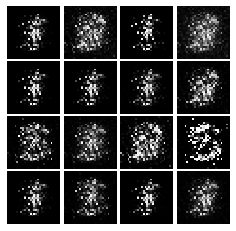

Epoch: 1, Iter: 840, D: 0.1424, G:0.2454


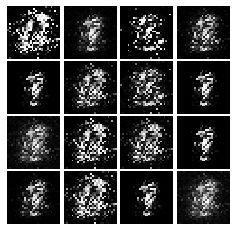

Epoch: 1, Iter: 860, D: 0.1901, G:2.565


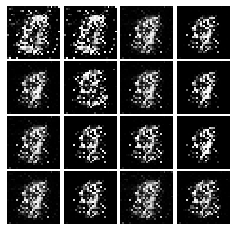

Epoch: 1, Iter: 880, D: 0.1477, G:0.2611


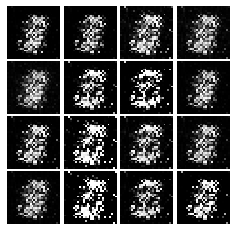

Epoch: 1, Iter: 900, D: 0.2801, G:0.3176


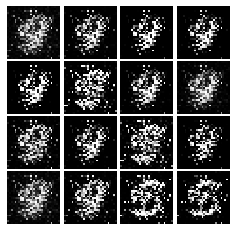

Epoch: 1, Iter: 920, D: 0.1924, G:0.2189


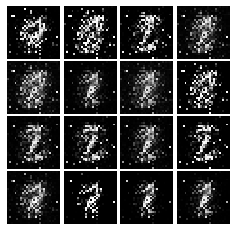

Epoch: 2, Iter: 940, D: 0.1482, G:0.4896


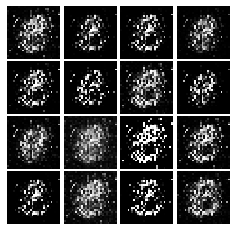

Epoch: 2, Iter: 960, D: 0.1987, G:0.2932


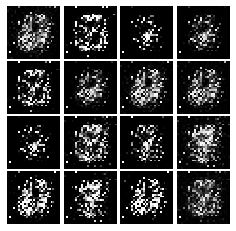

Epoch: 2, Iter: 980, D: 0.1344, G:0.4589


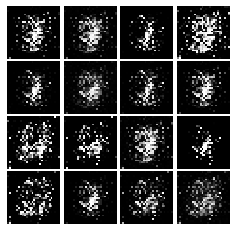

Epoch: 2, Iter: 1000, D: 0.2101, G:0.2775


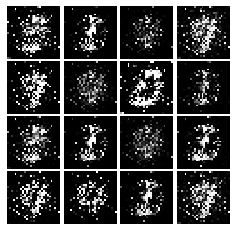

Epoch: 2, Iter: 1020, D: 0.1667, G:0.2877


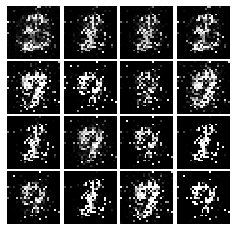

Epoch: 2, Iter: 1040, D: 0.156, G:0.596


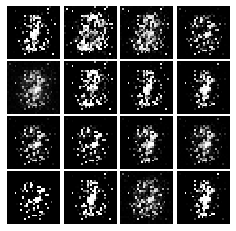

Epoch: 2, Iter: 1060, D: 0.1764, G:0.4157


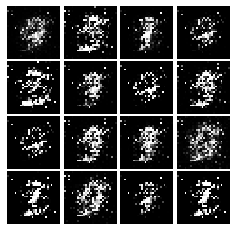

Epoch: 2, Iter: 1080, D: 0.1221, G:0.3686


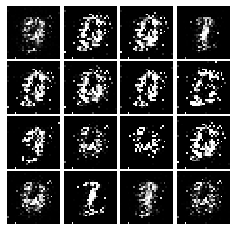

Epoch: 2, Iter: 1100, D: 0.1527, G:0.402


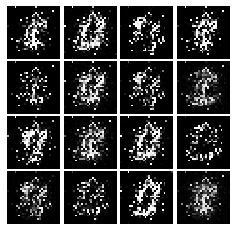

Epoch: 2, Iter: 1120, D: 0.1226, G:0.3247


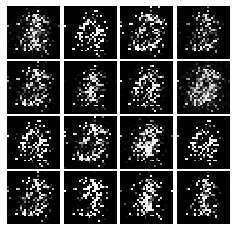

Epoch: 2, Iter: 1140, D: 0.09928, G:0.3941


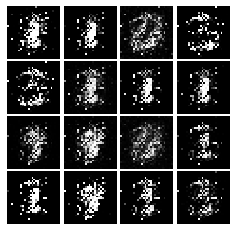

Epoch: 2, Iter: 1160, D: 0.1958, G:0.2501


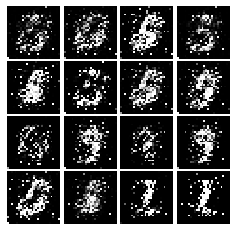

Epoch: 2, Iter: 1180, D: 0.1928, G:0.2818


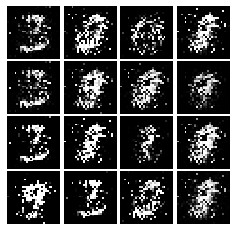

Epoch: 2, Iter: 1200, D: 0.352, G:0.2667


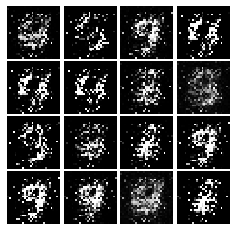

Epoch: 2, Iter: 1220, D: 0.1036, G:0.2711


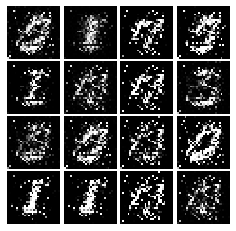

Epoch: 2, Iter: 1240, D: 0.1419, G:0.4595


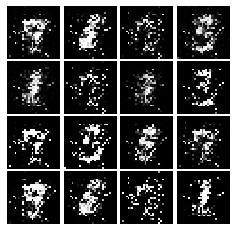

Epoch: 2, Iter: 1260, D: 0.1149, G:0.3372


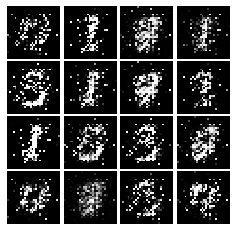

Epoch: 2, Iter: 1280, D: 0.1736, G:0.5252


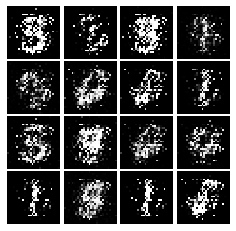

Epoch: 2, Iter: 1300, D: 0.1649, G:0.2798


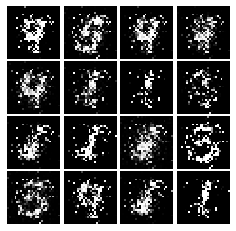

Epoch: 2, Iter: 1320, D: 0.1769, G:0.5202


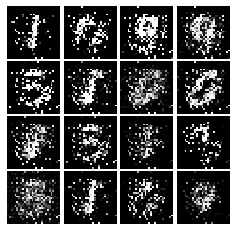

Epoch: 2, Iter: 1340, D: 0.1933, G:0.1278


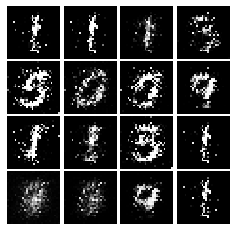

Epoch: 2, Iter: 1360, D: 0.1968, G:0.2503


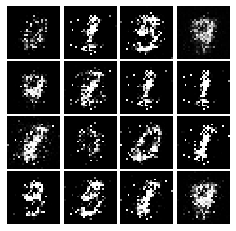

Epoch: 2, Iter: 1380, D: 0.182, G:0.2692


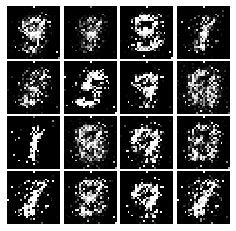

Epoch: 2, Iter: 1400, D: 0.2475, G:0.09002


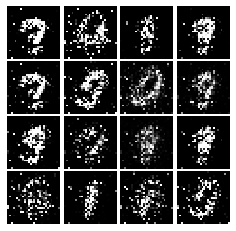

Epoch: 3, Iter: 1420, D: 0.2081, G:0.1849


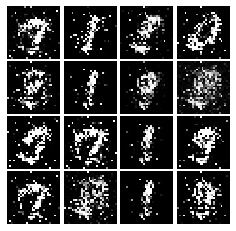

Epoch: 3, Iter: 1440, D: 0.179, G:0.3032


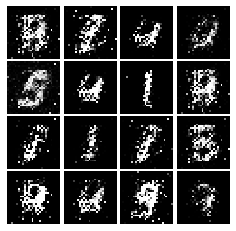

Epoch: 3, Iter: 1460, D: 0.2159, G:0.2829


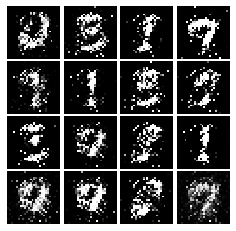

Epoch: 3, Iter: 1480, D: 0.9153, G:0.2903


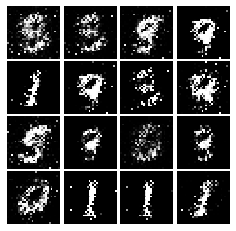

Epoch: 3, Iter: 1500, D: 0.2224, G:0.2787


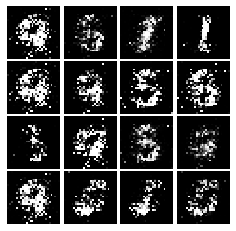

Epoch: 3, Iter: 1520, D: 0.2384, G:0.1541


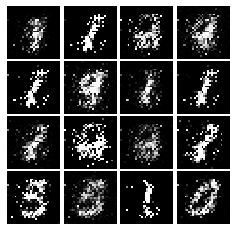

Epoch: 3, Iter: 1540, D: 0.1816, G:0.2305


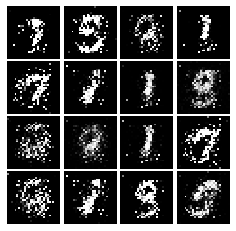

Epoch: 3, Iter: 1560, D: 0.1395, G:0.2518


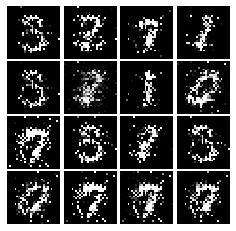

Epoch: 3, Iter: 1580, D: 0.135, G:0.3683


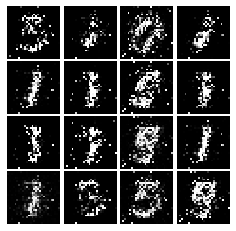

Epoch: 3, Iter: 1600, D: 0.1901, G:0.2246


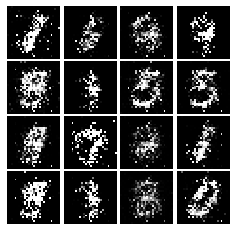

Epoch: 3, Iter: 1620, D: 0.2995, G:0.03888


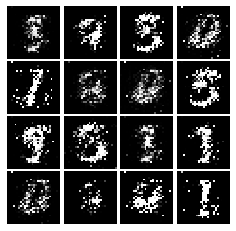

Epoch: 3, Iter: 1640, D: 0.1618, G:0.3087


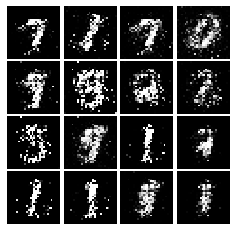

Epoch: 3, Iter: 1660, D: 0.1567, G:0.3881


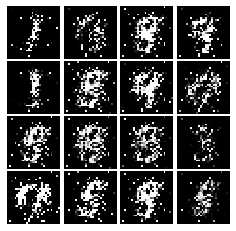

Epoch: 3, Iter: 1680, D: 0.1499, G:1.091


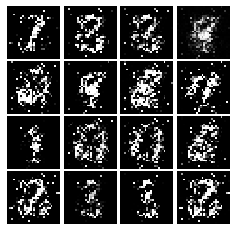

Epoch: 3, Iter: 1700, D: 0.2303, G:0.2262


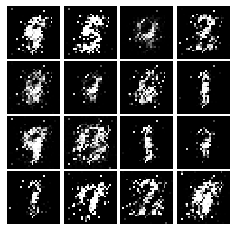

Epoch: 3, Iter: 1720, D: 0.206, G:0.264


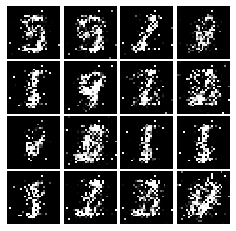

Epoch: 3, Iter: 1740, D: 0.1814, G:0.1979


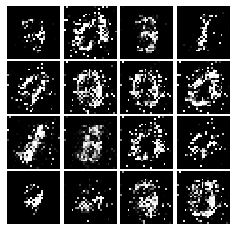

Epoch: 3, Iter: 1760, D: 0.2046, G:0.1434


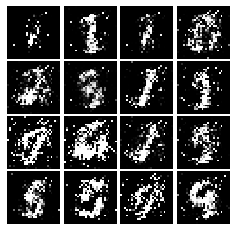

Epoch: 3, Iter: 1780, D: 0.1937, G:0.2005


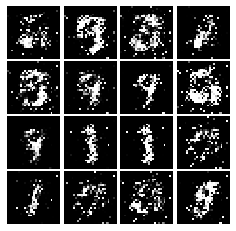

Epoch: 3, Iter: 1800, D: 0.2126, G:0.2015


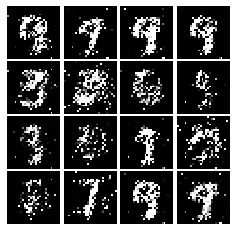

Epoch: 3, Iter: 1820, D: 0.1726, G:0.2249


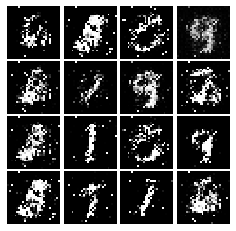

Epoch: 3, Iter: 1840, D: 0.2145, G:0.1227


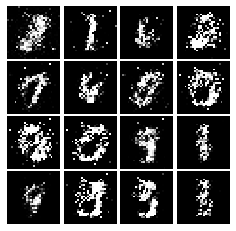

Epoch: 3, Iter: 1860, D: 0.1686, G:0.209


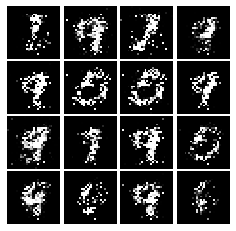

Epoch: 4, Iter: 1880, D: 0.4367, G:0.4286


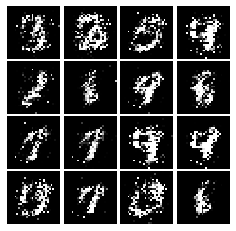

Epoch: 4, Iter: 1900, D: 0.214, G:0.2743


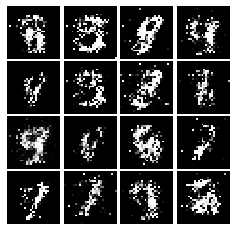

Epoch: 4, Iter: 1920, D: 0.2051, G:0.2245


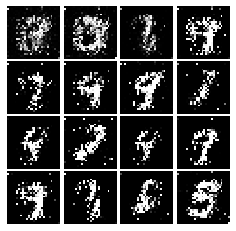

Epoch: 4, Iter: 1940, D: 0.1911, G:0.3148


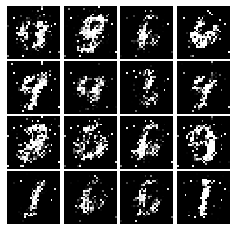

Epoch: 4, Iter: 1960, D: 0.1913, G:0.1996


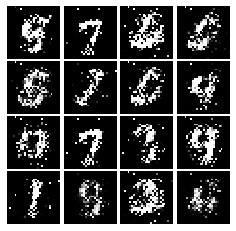

Epoch: 4, Iter: 1980, D: 0.2237, G:0.2149


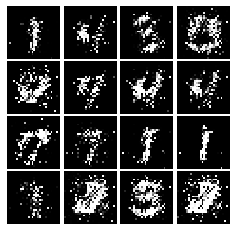

Epoch: 4, Iter: 2000, D: 0.1951, G:0.1481


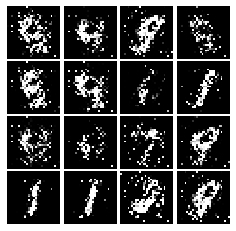

Epoch: 4, Iter: 2020, D: 0.2205, G:0.2552


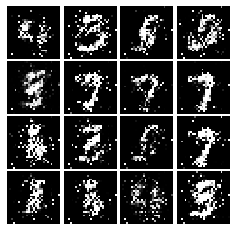

Epoch: 4, Iter: 2040, D: 0.2192, G:0.1991


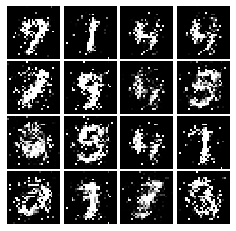

Epoch: 4, Iter: 2060, D: 0.1918, G:0.166


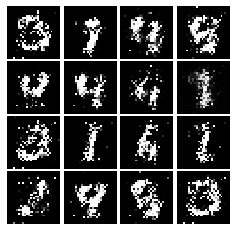

Epoch: 4, Iter: 2080, D: 0.1964, G:0.2844


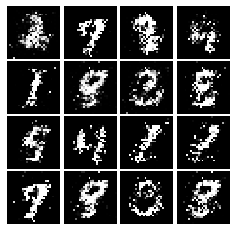

Epoch: 4, Iter: 2100, D: 0.1902, G:0.1652


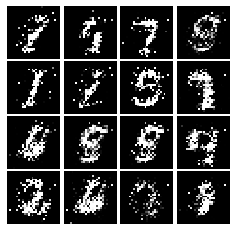

Epoch: 4, Iter: 2120, D: 0.191, G:0.2311


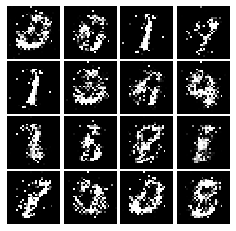

Epoch: 4, Iter: 2140, D: 0.1994, G:0.2507


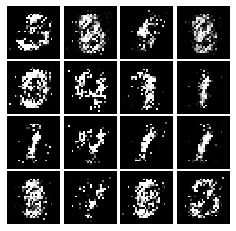

Epoch: 4, Iter: 2160, D: 0.2292, G:0.2181


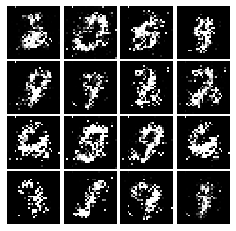

Epoch: 4, Iter: 2180, D: 0.1437, G:0.3024


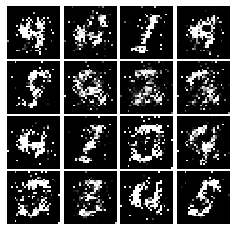

Epoch: 4, Iter: 2200, D: 0.1703, G:0.2978


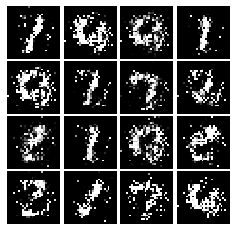

Epoch: 4, Iter: 2220, D: 0.1548, G:0.4254


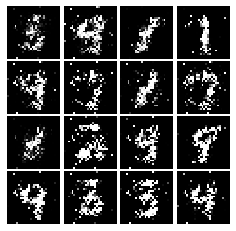

Epoch: 4, Iter: 2240, D: 0.1989, G:0.1619


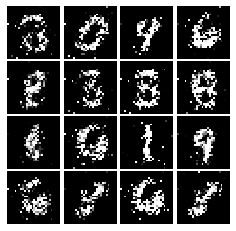

Epoch: 4, Iter: 2260, D: 0.156, G:0.2413


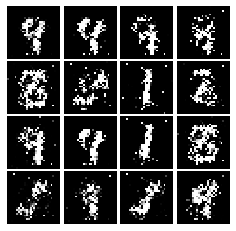

Epoch: 4, Iter: 2280, D: 0.1881, G:0.2782


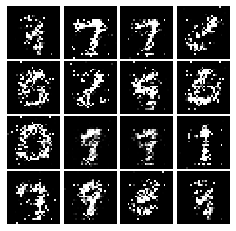

Epoch: 4, Iter: 2300, D: 0.1721, G:0.2179


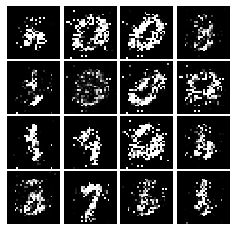

Epoch: 4, Iter: 2320, D: 0.1757, G:0.1269


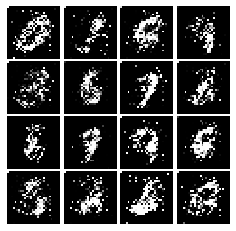

Epoch: 4, Iter: 2340, D: 0.145, G:0.2613


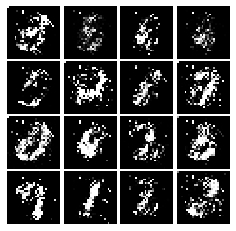

Epoch: 5, Iter: 2360, D: 0.1804, G:0.2179


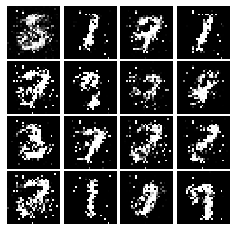

Epoch: 5, Iter: 2380, D: 0.2, G:0.239


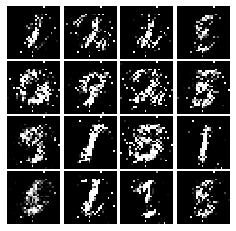

Epoch: 5, Iter: 2400, D: 0.2019, G:0.199


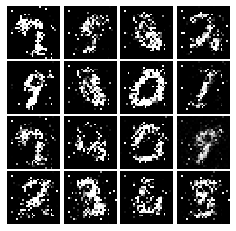

Epoch: 5, Iter: 2420, D: 0.2266, G:0.2119


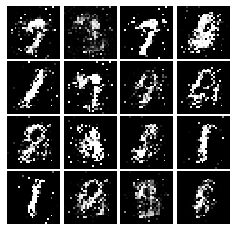

Epoch: 5, Iter: 2440, D: 0.1908, G:0.2362


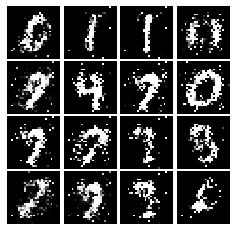

Epoch: 5, Iter: 2460, D: 0.1574, G:0.2412


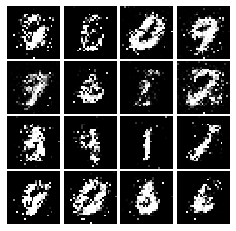

Epoch: 5, Iter: 2480, D: 0.1947, G:0.201


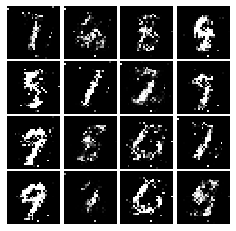

Epoch: 5, Iter: 2500, D: 0.1487, G:0.2586


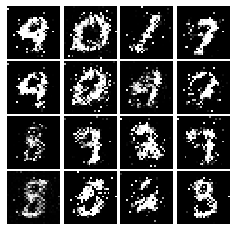

Epoch: 5, Iter: 2520, D: 0.1901, G:0.1906


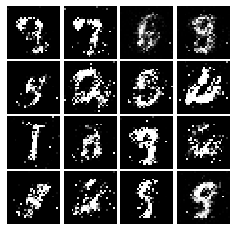

Epoch: 5, Iter: 2540, D: 0.2023, G:0.2097


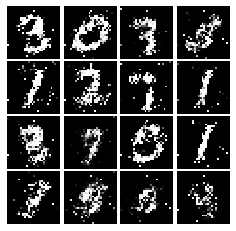

Epoch: 5, Iter: 2560, D: 0.2214, G:0.1962


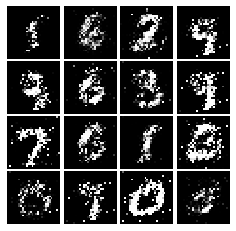

Epoch: 5, Iter: 2580, D: 0.2101, G:0.2531


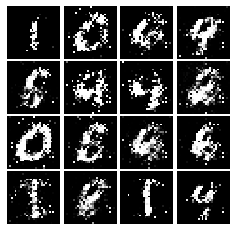

Epoch: 5, Iter: 2600, D: 0.2354, G:0.1644


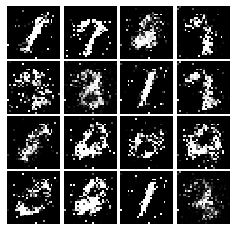

Epoch: 5, Iter: 2620, D: 0.1968, G:0.2325


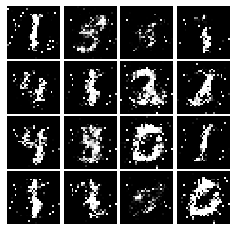

Epoch: 5, Iter: 2640, D: 0.2108, G:0.1951


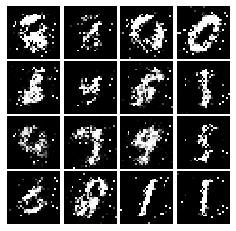

Epoch: 5, Iter: 2660, D: 0.22, G:0.188


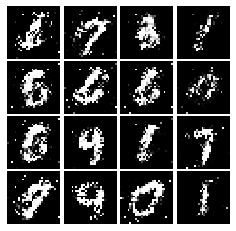

Epoch: 5, Iter: 2680, D: 0.2204, G:0.1797


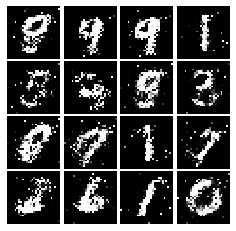

Epoch: 5, Iter: 2700, D: 0.2296, G:0.1516


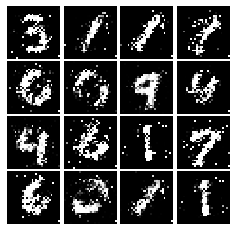

Epoch: 5, Iter: 2720, D: 0.2166, G:0.1779


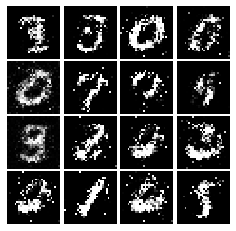

Epoch: 5, Iter: 2740, D: 0.2354, G:0.187


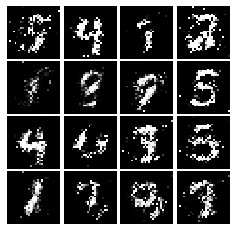

Epoch: 5, Iter: 2760, D: 0.2255, G:0.1834


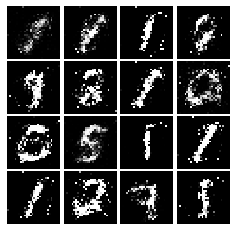

Epoch: 5, Iter: 2780, D: 0.229, G:0.1665


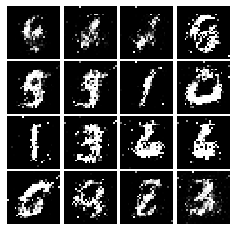

Epoch: 5, Iter: 2800, D: 0.1953, G:0.1846


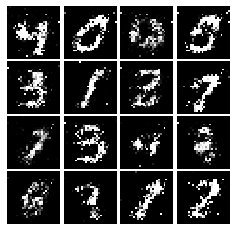

Epoch: 6, Iter: 2820, D: 0.2211, G:0.1599


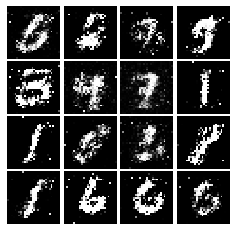

Epoch: 6, Iter: 2840, D: 0.2006, G:0.1982


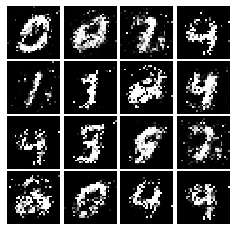

Epoch: 6, Iter: 2860, D: 0.2134, G:0.1945


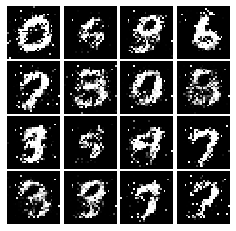

Epoch: 6, Iter: 2880, D: 0.2111, G:0.1899


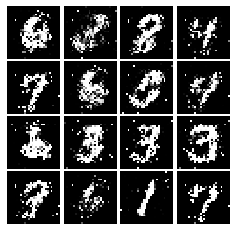

Epoch: 6, Iter: 2900, D: 0.2251, G:0.1935


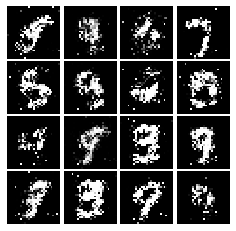

Epoch: 6, Iter: 2920, D: 0.2312, G:0.1712


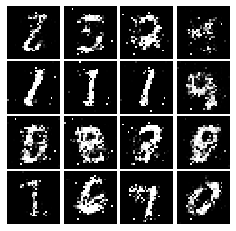

Epoch: 6, Iter: 2940, D: 0.2451, G:0.2754


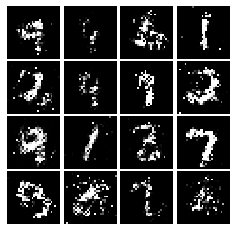

Epoch: 6, Iter: 2960, D: 0.2334, G:0.1837


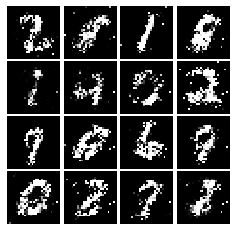

Epoch: 6, Iter: 2980, D: 0.2347, G:0.1633


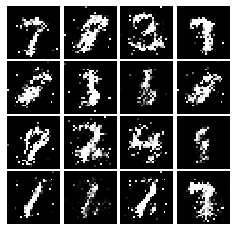

Epoch: 6, Iter: 3000, D: 0.2083, G:0.2241


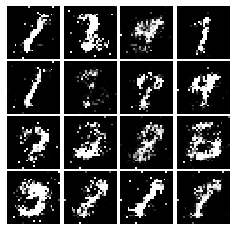

Epoch: 6, Iter: 3020, D: 0.2251, G:0.1882


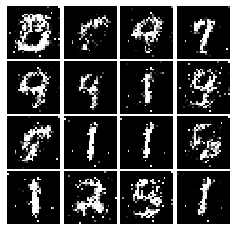

Epoch: 6, Iter: 3040, D: 0.2085, G:0.1935


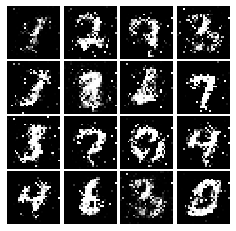

Epoch: 6, Iter: 3060, D: 0.228, G:0.1684


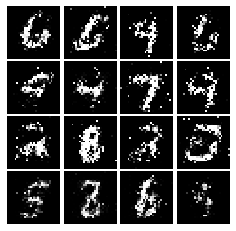

Epoch: 6, Iter: 3080, D: 0.2297, G:0.2061


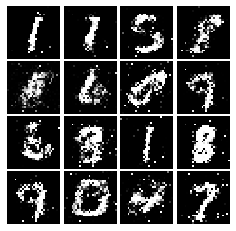

Epoch: 6, Iter: 3100, D: 0.2018, G:0.1777


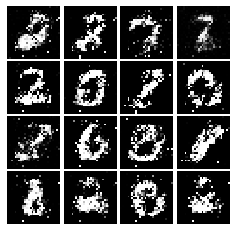

Epoch: 6, Iter: 3120, D: 0.2224, G:0.164


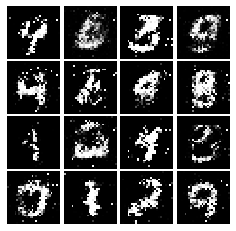

Epoch: 6, Iter: 3140, D: 0.2405, G:0.1749


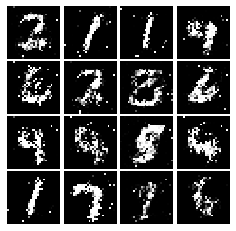

Epoch: 6, Iter: 3160, D: 0.2185, G:0.1835


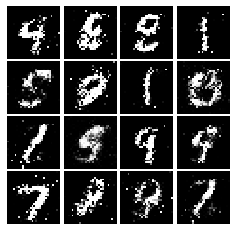

Epoch: 6, Iter: 3180, D: 0.2074, G:0.1773


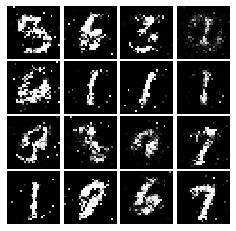

Epoch: 6, Iter: 3200, D: 0.2019, G:0.1835


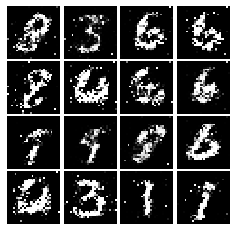

Epoch: 6, Iter: 3220, D: 0.2316, G:0.1839


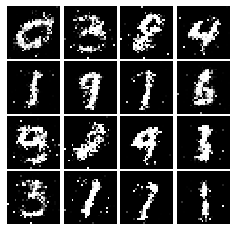

Epoch: 6, Iter: 3240, D: 0.1922, G:0.174


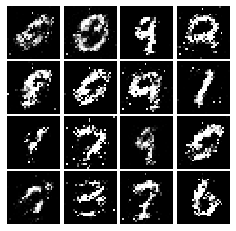

Epoch: 6, Iter: 3260, D: 0.2501, G:0.1863


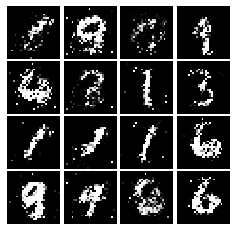

Epoch: 6, Iter: 3280, D: 0.229, G:0.1964


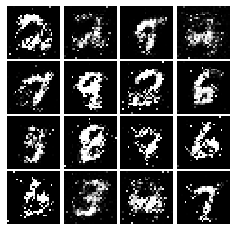

Epoch: 7, Iter: 3300, D: 0.2127, G:0.207


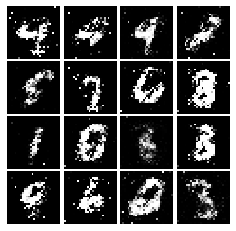

Epoch: 7, Iter: 3320, D: 0.203, G:0.1863


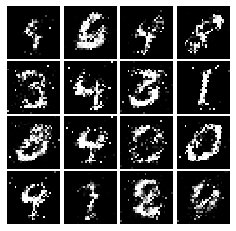

Epoch: 7, Iter: 3340, D: 0.2246, G:0.2245


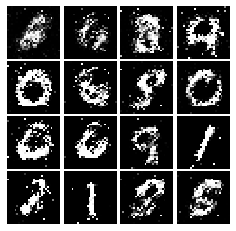

Epoch: 7, Iter: 3360, D: 0.2288, G:0.1992


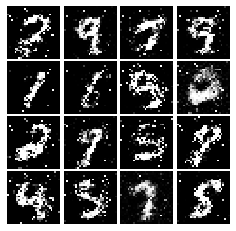

Epoch: 7, Iter: 3380, D: 0.2376, G:0.1446


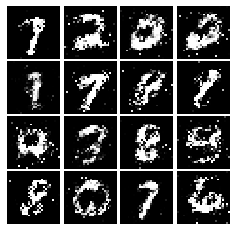

Epoch: 7, Iter: 3400, D: 0.2209, G:0.188


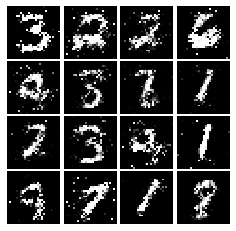

Epoch: 7, Iter: 3420, D: 0.233, G:0.1554


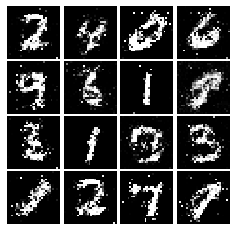

Epoch: 7, Iter: 3440, D: 0.2157, G:0.2102


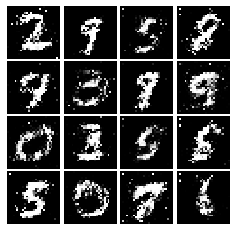

Epoch: 7, Iter: 3460, D: 0.2196, G:0.2073


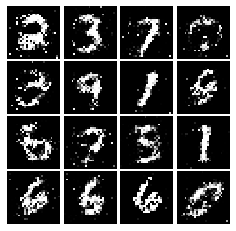

Epoch: 7, Iter: 3480, D: 0.2362, G:0.1887


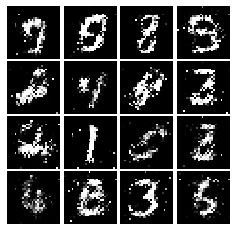

Epoch: 7, Iter: 3500, D: 0.2074, G:0.1571


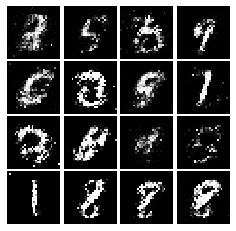

Epoch: 7, Iter: 3520, D: 0.2366, G:0.1732


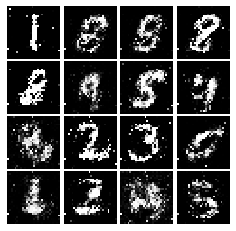

Epoch: 7, Iter: 3540, D: 0.2238, G:0.1687


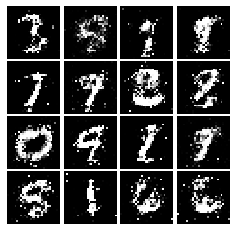

Epoch: 7, Iter: 3560, D: 0.2075, G:0.2024


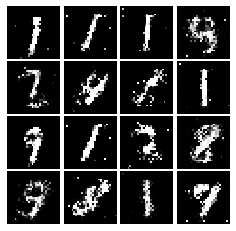

Epoch: 7, Iter: 3580, D: 0.2318, G:0.177


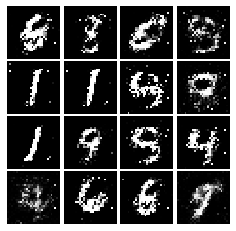

Epoch: 7, Iter: 3600, D: 0.225, G:0.1709


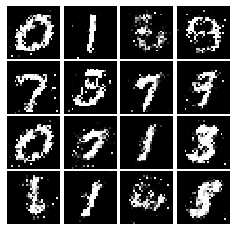

Epoch: 7, Iter: 3620, D: 0.2175, G:0.1653


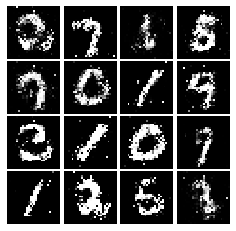

Epoch: 7, Iter: 3640, D: 0.2453, G:0.154


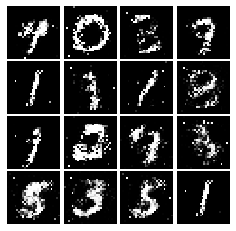

Epoch: 7, Iter: 3660, D: 0.2375, G:0.1746


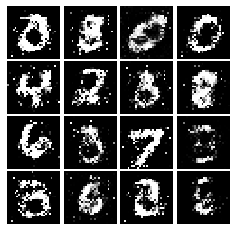

Epoch: 7, Iter: 3680, D: 0.2278, G:0.1919


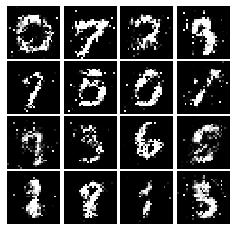

Epoch: 7, Iter: 3700, D: 0.2123, G:0.2318


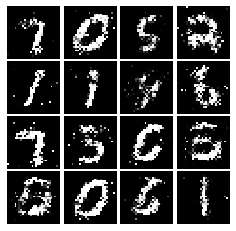

Epoch: 7, Iter: 3720, D: 0.2255, G:0.1767


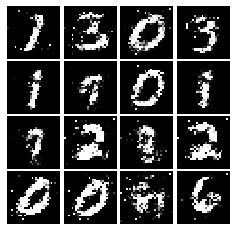

Epoch: 7, Iter: 3740, D: 0.24, G:0.1669


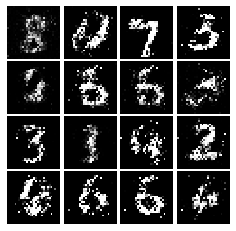

Epoch: 8, Iter: 3760, D: 0.2304, G:0.1753


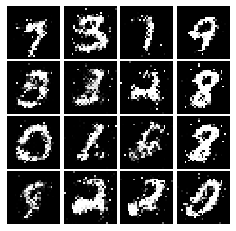

Epoch: 8, Iter: 3780, D: 0.2316, G:0.171


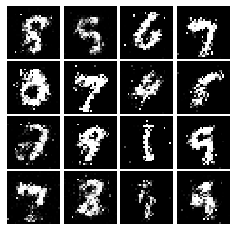

Epoch: 8, Iter: 3800, D: 0.2423, G:0.1589


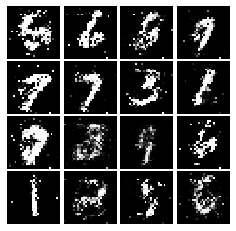

Epoch: 8, Iter: 3820, D: 0.2104, G:0.1614


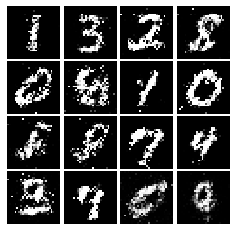

Epoch: 8, Iter: 3840, D: 0.2548, G:0.1995


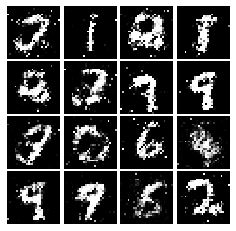

Epoch: 8, Iter: 3860, D: 0.2103, G:0.1616


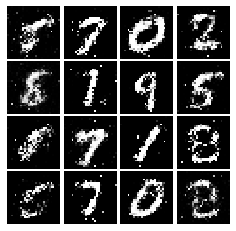

Epoch: 8, Iter: 3880, D: 0.2257, G:0.1747


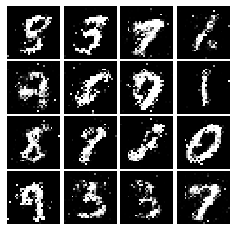

Epoch: 8, Iter: 3900, D: 0.2503, G:0.1785


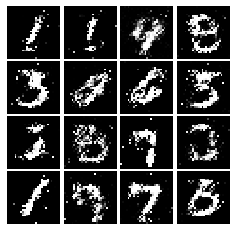

Epoch: 8, Iter: 3920, D: 0.2003, G:0.1544


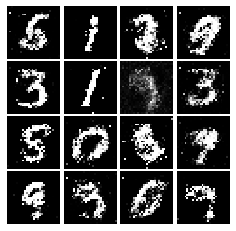

Epoch: 8, Iter: 3940, D: 0.2514, G:0.1725


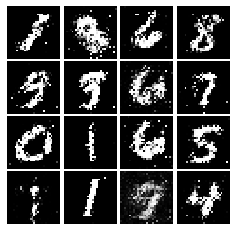

Epoch: 8, Iter: 3960, D: 0.2393, G:0.1653


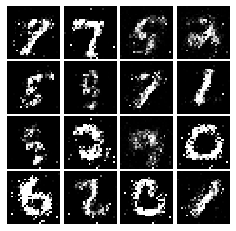

Epoch: 8, Iter: 3980, D: 0.2295, G:0.1612


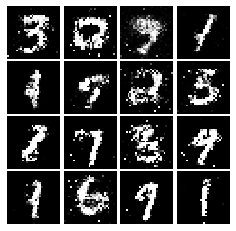

Epoch: 8, Iter: 4000, D: 0.2242, G:0.162


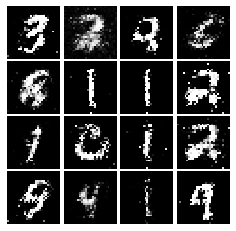

Epoch: 8, Iter: 4020, D: 0.2348, G:0.1468


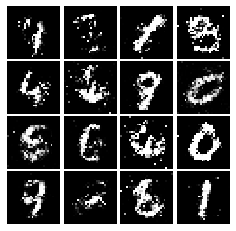

Epoch: 8, Iter: 4040, D: 0.2207, G:0.1529


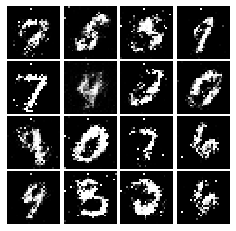

Epoch: 8, Iter: 4060, D: 0.243, G:0.168


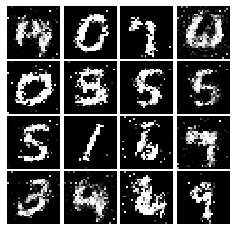

Epoch: 8, Iter: 4080, D: 0.2338, G:0.1408


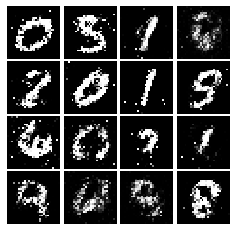

Epoch: 8, Iter: 4100, D: 0.2452, G:0.1872


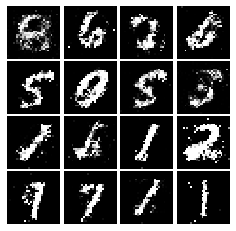

Epoch: 8, Iter: 4120, D: 0.2256, G:0.1691


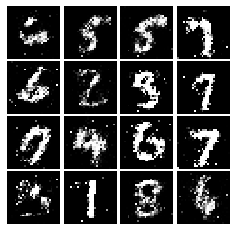

Epoch: 8, Iter: 4140, D: 0.2281, G:0.1659


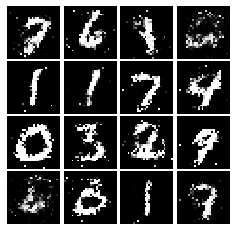

Epoch: 8, Iter: 4160, D: 0.2438, G:0.1512


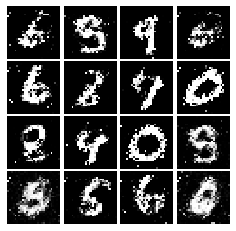

Epoch: 8, Iter: 4180, D: 0.243, G:0.1675


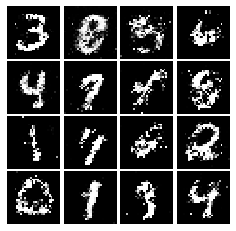

Epoch: 8, Iter: 4200, D: 0.2385, G:0.1639


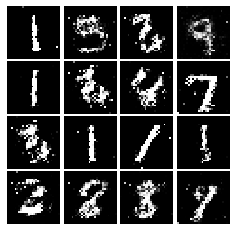

Epoch: 8, Iter: 4220, D: 0.2107, G:0.1759


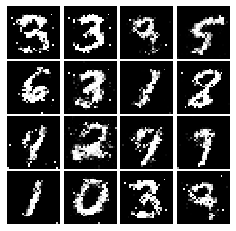

Epoch: 9, Iter: 4240, D: 0.235, G:0.1919


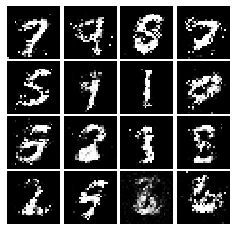

Epoch: 9, Iter: 4260, D: 0.2441, G:0.2038


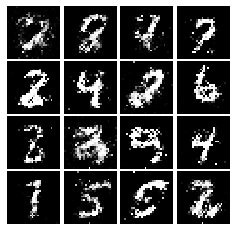

Epoch: 9, Iter: 4280, D: 0.2355, G:0.158


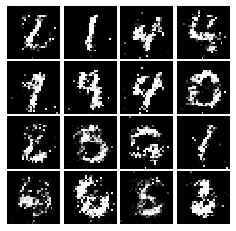

Epoch: 9, Iter: 4300, D: 0.2141, G:0.1489


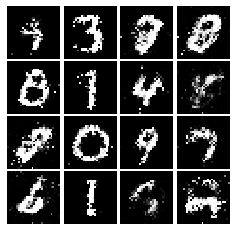

Epoch: 9, Iter: 4320, D: 0.2343, G:0.1946


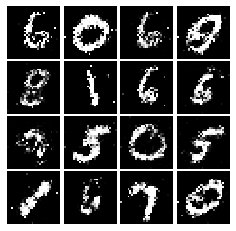

Epoch: 9, Iter: 4340, D: 0.2248, G:0.1724


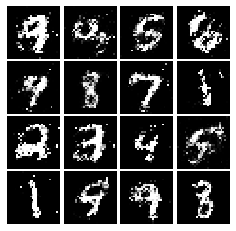

Epoch: 9, Iter: 4360, D: 0.2456, G:0.1361


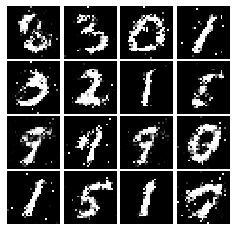

Epoch: 9, Iter: 4380, D: 0.2318, G:0.1536


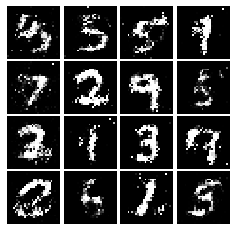

Epoch: 9, Iter: 4400, D: 0.2071, G:0.1935


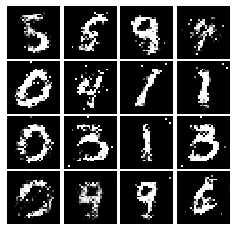

Epoch: 9, Iter: 4420, D: 0.218, G:0.15


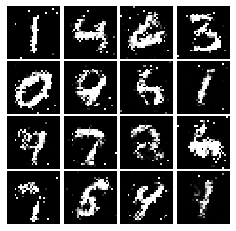

Epoch: 9, Iter: 4440, D: 0.2382, G:0.1638


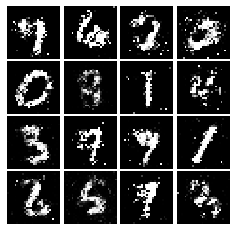

Epoch: 9, Iter: 4460, D: 0.2504, G:0.16


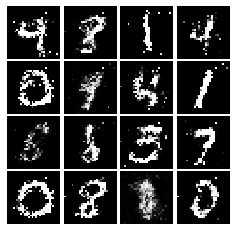

Epoch: 9, Iter: 4480, D: 0.2251, G:0.1712


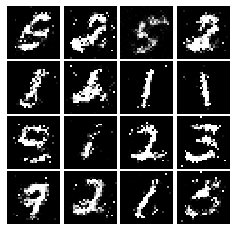

Epoch: 9, Iter: 4500, D: 0.2687, G:0.1524


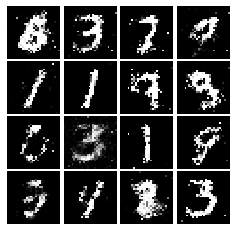

Epoch: 9, Iter: 4520, D: 0.2573, G:0.1508


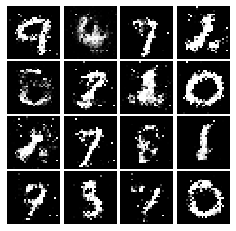

Epoch: 9, Iter: 4540, D: 0.2344, G:0.1597


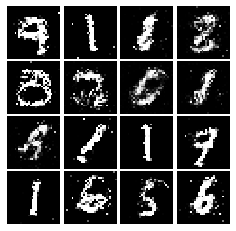

Epoch: 9, Iter: 4560, D: 0.2625, G:0.1585


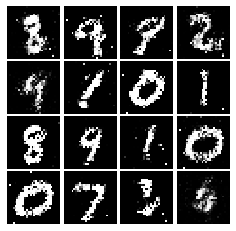

Epoch: 9, Iter: 4580, D: 0.2371, G:0.1441


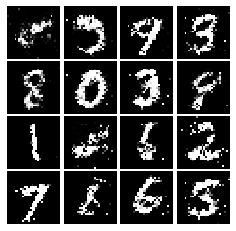

Epoch: 9, Iter: 4600, D: 0.2587, G:0.1459


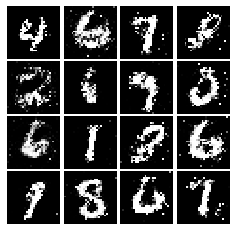

Epoch: 9, Iter: 4620, D: 0.2298, G:0.172


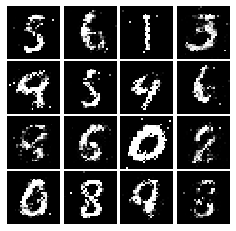

Epoch: 9, Iter: 4640, D: 0.2205, G:0.1798


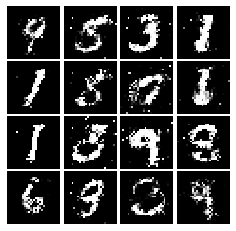

Epoch: 9, Iter: 4660, D: 0.229, G:0.1611


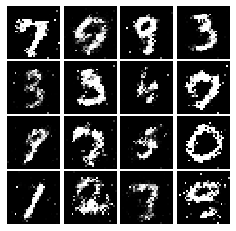

Epoch: 9, Iter: 4680, D: 0.25, G:0.165


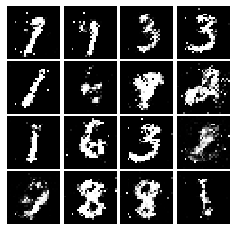

Final images


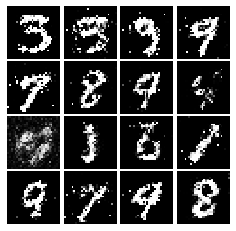

In [20]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [21]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.Input(784),
        tf.keras.layers.Reshape((28,28,1)),
        tf.keras.layers.Conv2D(kernel_size=5, strides=1, filters=32 ,activation=leaky_relu),
        tf.keras.layers.MaxPool2D(pool_size=2, strides=2),
        tf.keras.layers.Conv2D(kernel_size=5, strides=1, filters=64 ,activation=leaky_relu),
        tf.keras.layers.MaxPool2D(pool_size=2, strides=2),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(units=1024, activation=leaky_relu),
        tf.keras.layers.Dense(units=1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [22]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.Input(noise_dim),
        tf.keras.layers.Dense(units=1024, activation=tf.nn.relu),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dense(units=7*7*128, activation=tf.nn.relu),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Reshape((7, 7, 128)),
        tf.keras.layers.Conv2DTranspose(filters=64, kernel_size=4, strides=2, activation=tf.nn.relu, padding='same'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2DTranspose(filters=1, kernel_size=4, strides=2, activation=tf.nn.tanh, padding='same'),
#         tf.keras.layers.Flatten()

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.357, G:0.6612


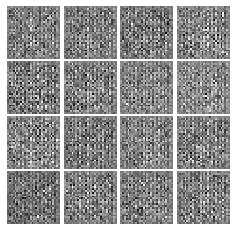

Epoch: 0, Iter: 20, D: 2.028, G:0.8567


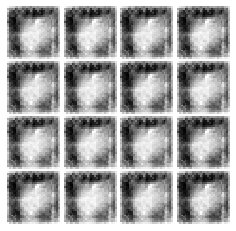

Epoch: 0, Iter: 40, D: 0.1682, G:3.326


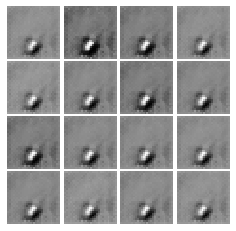

Epoch: 0, Iter: 60, D: 0.7353, G:1.444


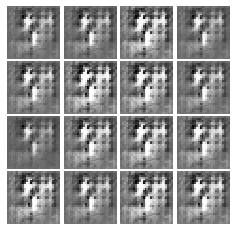

Epoch: 0, Iter: 80, D: 0.9072, G:7.959


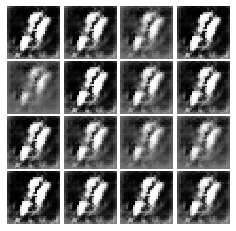

Epoch: 0, Iter: 100, D: 0.6439, G:4.078


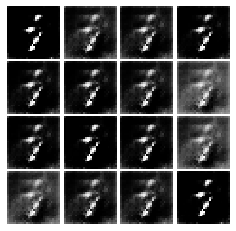

Epoch: 0, Iter: 120, D: 0.1844, G:5.115


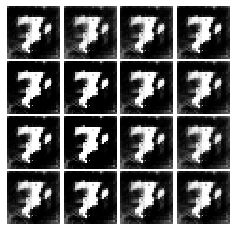

Epoch: 0, Iter: 140, D: 0.0535, G:5.017


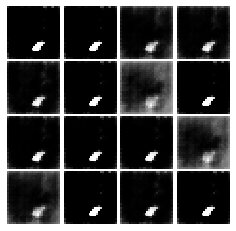

Epoch: 0, Iter: 160, D: 0.6862, G:1.562


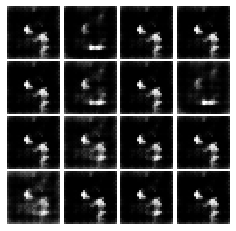

Epoch: 0, Iter: 180, D: 0.7217, G:3.835


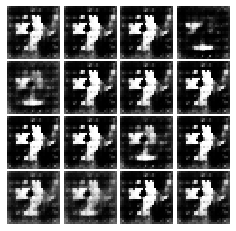

Epoch: 0, Iter: 200, D: 0.2042, G:3.651


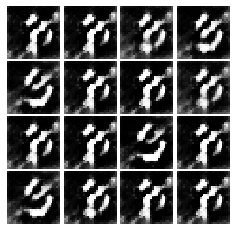

Epoch: 0, Iter: 220, D: 1.027, G:4.145


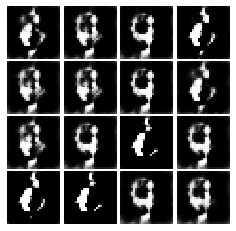

Epoch: 0, Iter: 240, D: 0.4081, G:2.881


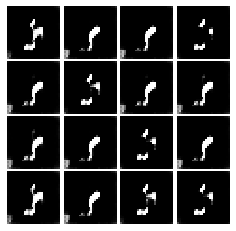

Epoch: 0, Iter: 260, D: 4.648, G:3.792


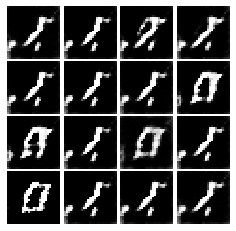

Epoch: 0, Iter: 280, D: 1.021, G:2.017


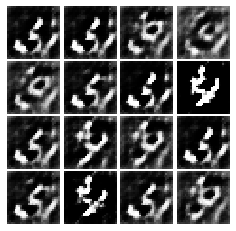

Epoch: 0, Iter: 300, D: 1.215, G:2.358


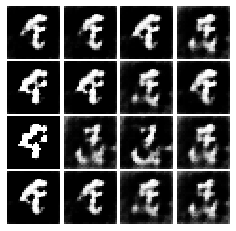

Epoch: 0, Iter: 320, D: 0.6551, G:1.932


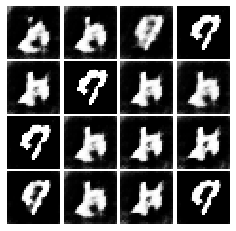

Epoch: 0, Iter: 340, D: 1.191, G:5.447


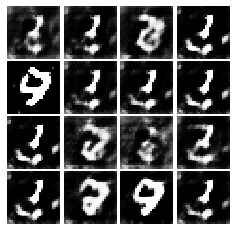

Epoch: 0, Iter: 360, D: 0.9762, G:7.466


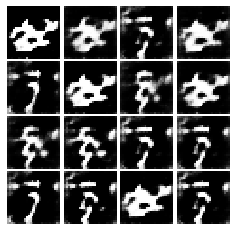

Epoch: 0, Iter: 380, D: 0.2169, G:3.817


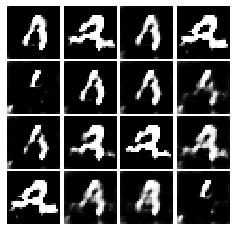

Epoch: 0, Iter: 400, D: 0.6465, G:2.074


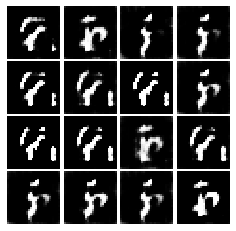

Epoch: 0, Iter: 420, D: 0.6489, G:4.067


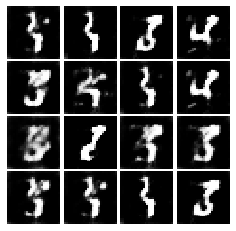

Epoch: 0, Iter: 440, D: 0.6487, G:1.794


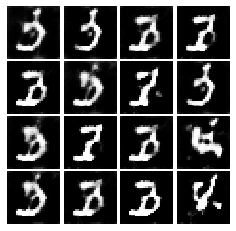

Epoch: 0, Iter: 460, D: 1.468, G:2.796


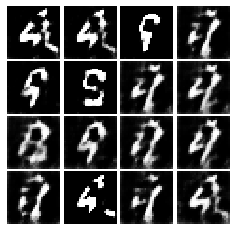

Epoch: 1, Iter: 480, D: 1.315, G:1.326


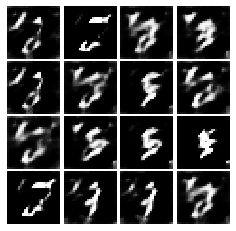

Epoch: 1, Iter: 500, D: 0.3826, G:2.523


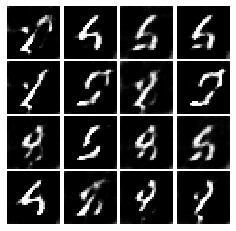

Epoch: 1, Iter: 520, D: 0.4612, G:2.575


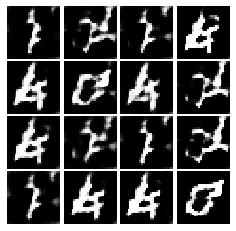

Epoch: 1, Iter: 540, D: 0.7185, G:2.271


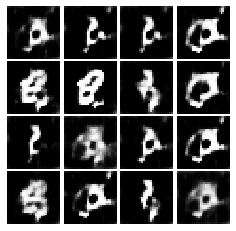

Epoch: 1, Iter: 560, D: 0.7898, G:3.252


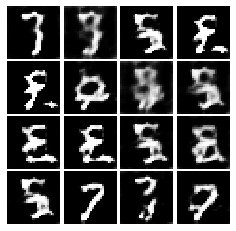

Epoch: 1, Iter: 580, D: 0.5657, G:2.434


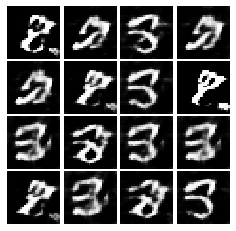

Epoch: 1, Iter: 600, D: 0.5381, G:1.853


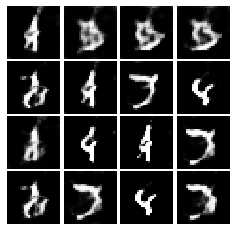

Epoch: 1, Iter: 620, D: 0.8735, G:3.105


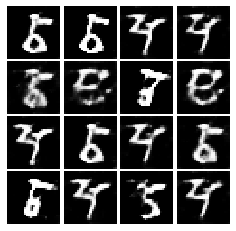

Epoch: 1, Iter: 640, D: 0.6323, G:3.743


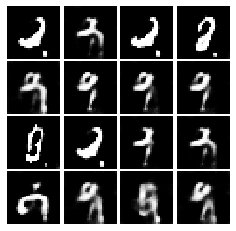

Epoch: 1, Iter: 660, D: 0.5319, G:3.206


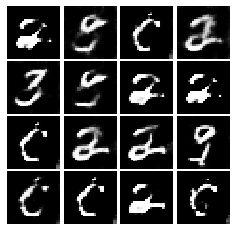

Epoch: 1, Iter: 680, D: 0.6715, G:1.827


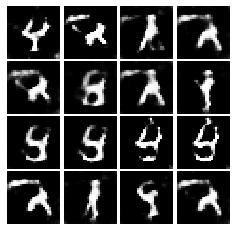

Epoch: 1, Iter: 700, D: 0.518, G:2.805


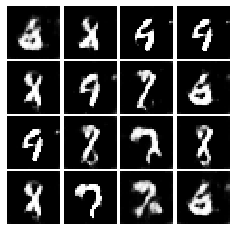

Epoch: 1, Iter: 720, D: 0.8272, G:2.594


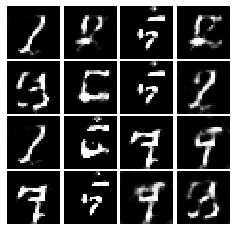

Epoch: 1, Iter: 740, D: 0.8552, G:7.376


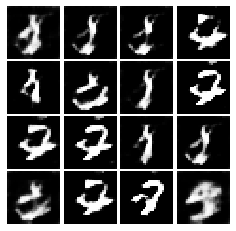

Epoch: 1, Iter: 760, D: 0.7201, G:2.141


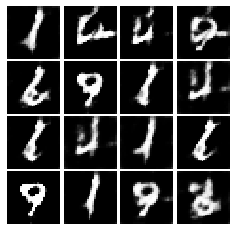

Epoch: 1, Iter: 780, D: 0.5784, G:2.762


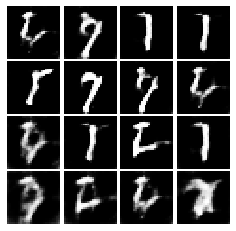

Epoch: 1, Iter: 800, D: 0.6248, G:2.563


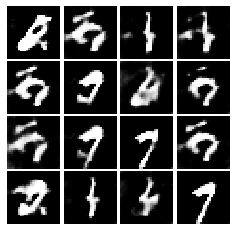

Epoch: 1, Iter: 820, D: 1.191, G:0.8882


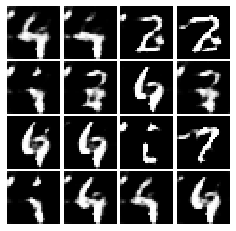

Epoch: 1, Iter: 840, D: 0.5335, G:2.994


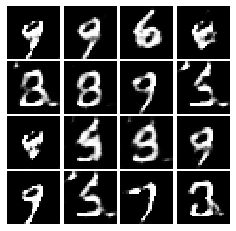

Epoch: 1, Iter: 860, D: 0.6649, G:2.812


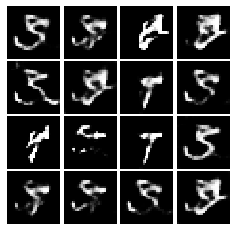

Epoch: 1, Iter: 880, D: 0.4332, G:2.289


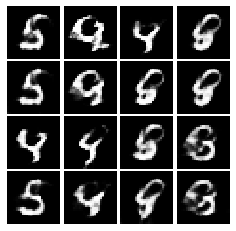

Epoch: 1, Iter: 900, D: 0.4942, G:2.142


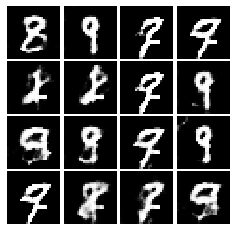

Epoch: 1, Iter: 920, D: 0.2174, G:3.331


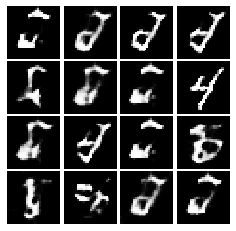

Epoch: 2, Iter: 940, D: 0.5123, G:3.57


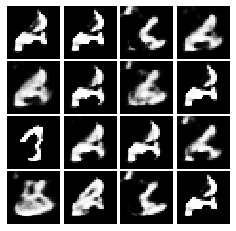

Epoch: 2, Iter: 960, D: 0.8044, G:4.711


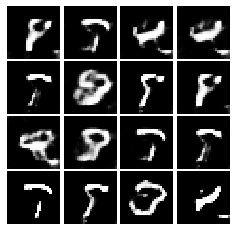

Epoch: 2, Iter: 980, D: 0.6337, G:2.071


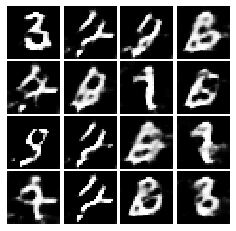

Epoch: 2, Iter: 1000, D: 0.5024, G:2.892


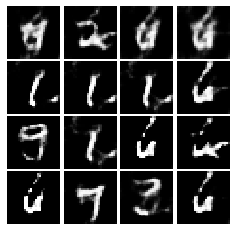

Epoch: 2, Iter: 1020, D: 0.3558, G:3.551


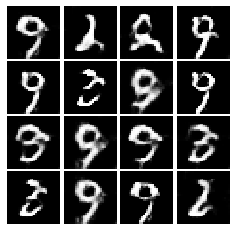

Epoch: 2, Iter: 1040, D: 0.4036, G:1.966


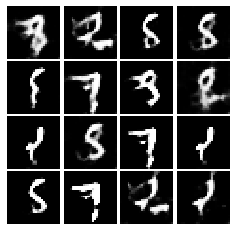

Epoch: 2, Iter: 1060, D: 0.4625, G:4.095


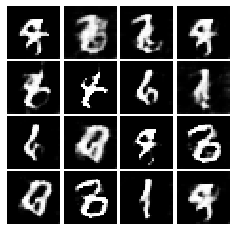

Epoch: 2, Iter: 1080, D: 0.5235, G:2.73


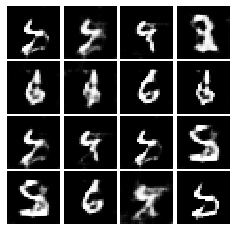

Epoch: 2, Iter: 1100, D: 0.467, G:2.564


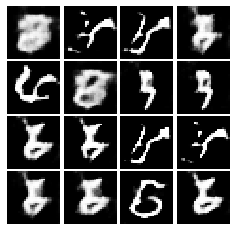

Epoch: 2, Iter: 1120, D: 0.4899, G:2.787


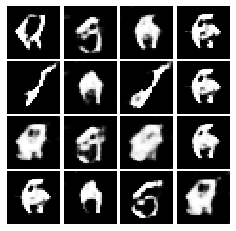

Epoch: 2, Iter: 1140, D: 0.602, G:3.176


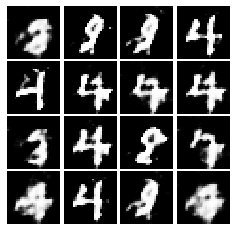

Epoch: 2, Iter: 1160, D: 0.6503, G:3.662


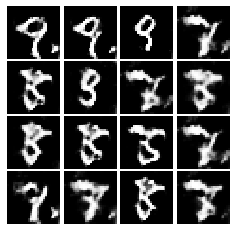

Epoch: 2, Iter: 1180, D: 0.3614, G:3.42


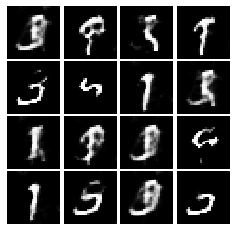

Epoch: 2, Iter: 1200, D: 0.4373, G:2.891


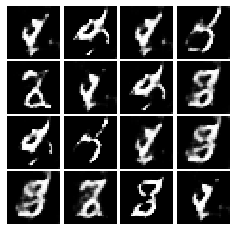

Epoch: 2, Iter: 1220, D: 0.6744, G:3.571


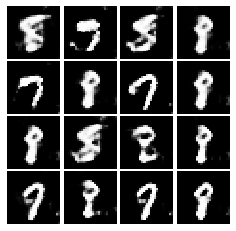

Epoch: 2, Iter: 1240, D: 0.6191, G:4.798


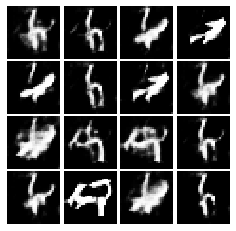

Epoch: 2, Iter: 1260, D: 0.4342, G:2.373


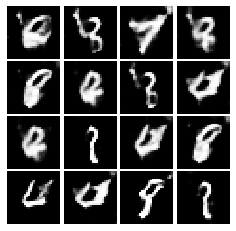

Epoch: 2, Iter: 1280, D: 0.4633, G:3.978


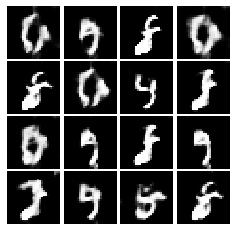

Epoch: 2, Iter: 1300, D: 0.4427, G:3.034


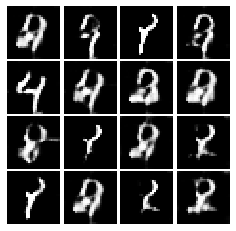

Epoch: 2, Iter: 1320, D: 0.526, G:2.961


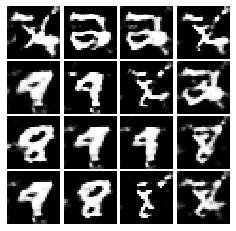

Epoch: 2, Iter: 1340, D: 0.4711, G:2.33


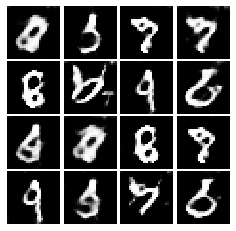

Epoch: 2, Iter: 1360, D: 0.6195, G:5.237


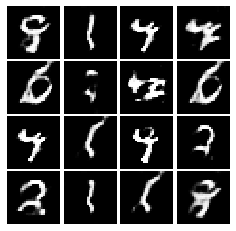

Epoch: 2, Iter: 1380, D: 0.4521, G:3.008


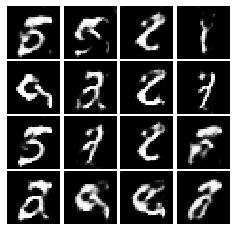

Epoch: 2, Iter: 1400, D: 0.328, G:3.326


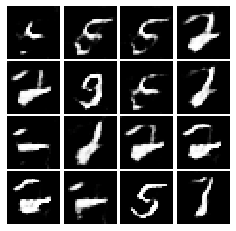

Epoch: 3, Iter: 1420, D: 0.2771, G:3.181


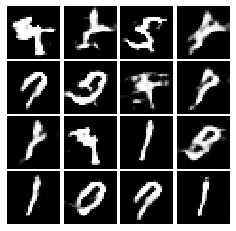

Epoch: 3, Iter: 1440, D: 0.5923, G:2.536


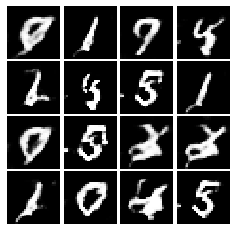

Epoch: 3, Iter: 1460, D: 0.6857, G:1.803


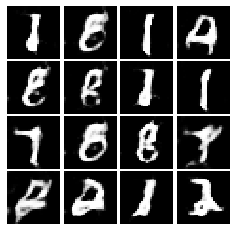

Epoch: 3, Iter: 1480, D: 0.4441, G:3.146


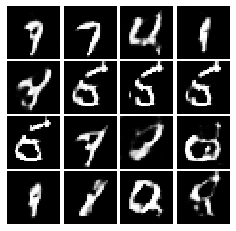

Epoch: 3, Iter: 1500, D: 0.9491, G:4.039


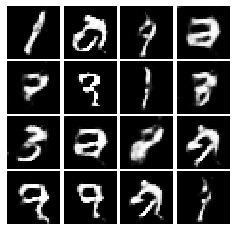

Epoch: 3, Iter: 1520, D: 0.4991, G:2.175


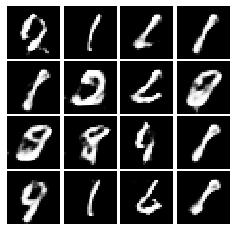

Epoch: 3, Iter: 1540, D: 0.604, G:3.577


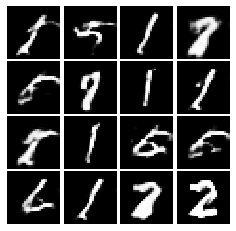

Epoch: 3, Iter: 1560, D: 0.565, G:1.942


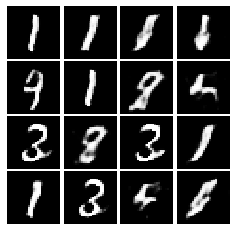

Epoch: 3, Iter: 1580, D: 0.6341, G:2.215


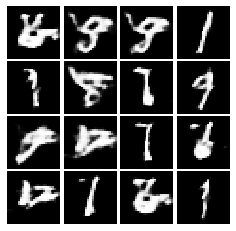

Epoch: 3, Iter: 1600, D: 0.6124, G:1.845


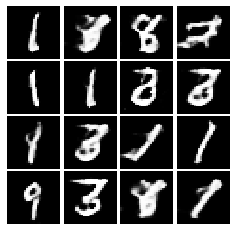

Epoch: 3, Iter: 1620, D: 0.5267, G:2.198


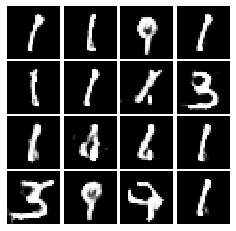

Epoch: 3, Iter: 1640, D: 0.6105, G:2.774


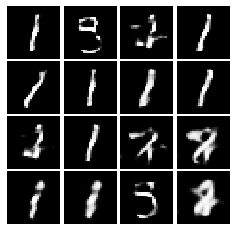

Epoch: 3, Iter: 1660, D: 0.6364, G:2.644


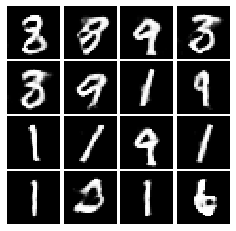

Epoch: 3, Iter: 1680, D: 0.6346, G:2.231


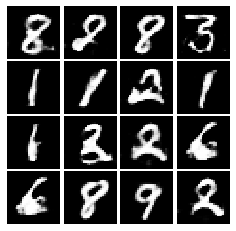

Epoch: 3, Iter: 1700, D: 0.6394, G:2.296


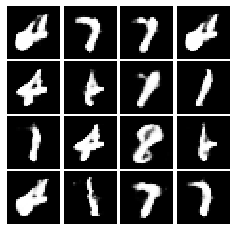

Epoch: 3, Iter: 1720, D: 0.5337, G:1.919


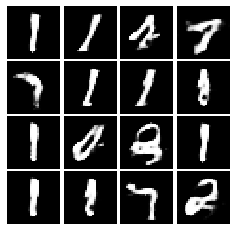

Epoch: 3, Iter: 1740, D: 0.5931, G:1.94


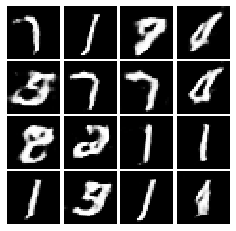

Epoch: 3, Iter: 1760, D: 0.5557, G:2.491


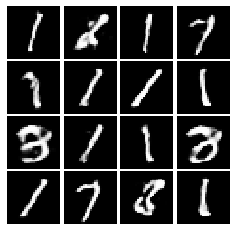

Epoch: 3, Iter: 1780, D: 0.601, G:2.303


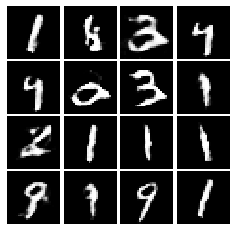

Epoch: 3, Iter: 1800, D: 0.6287, G:1.496


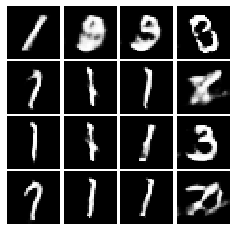

Epoch: 3, Iter: 1820, D: 0.7433, G:1.811


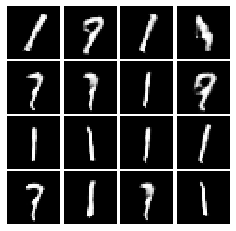

Epoch: 3, Iter: 1840, D: 0.5704, G:1.974


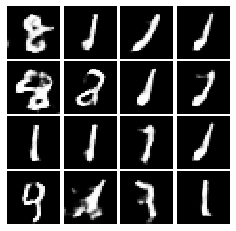

Epoch: 3, Iter: 1860, D: 0.5987, G:2.405


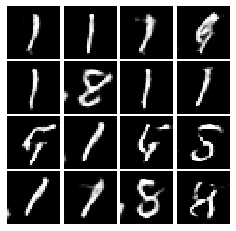

Epoch: 4, Iter: 1880, D: 0.4651, G:2.138


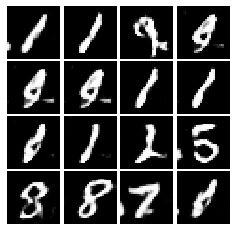

Epoch: 4, Iter: 1900, D: 0.5385, G:1.992


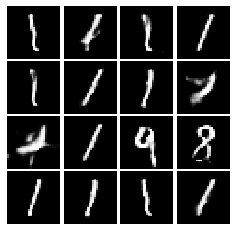

Epoch: 4, Iter: 1920, D: 0.5957, G:2.094


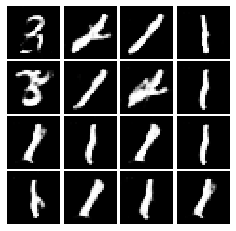

Epoch: 4, Iter: 1940, D: 0.4951, G:2.021


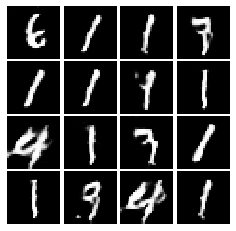

Epoch: 4, Iter: 1960, D: 0.5271, G:2.537


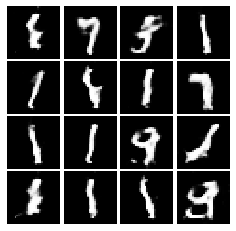

Epoch: 4, Iter: 1980, D: 0.5524, G:1.85


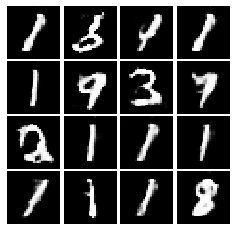

Epoch: 4, Iter: 2000, D: 0.751, G:1.87


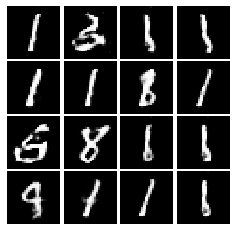

Epoch: 4, Iter: 2020, D: 0.6121, G:1.793


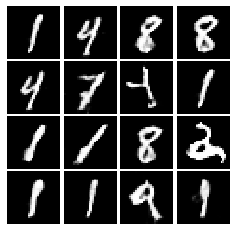

Epoch: 4, Iter: 2040, D: 0.6042, G:2.146


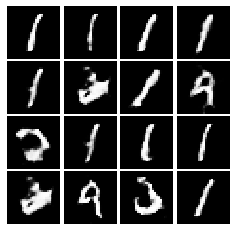

Epoch: 4, Iter: 2060, D: 0.4, G:2.609


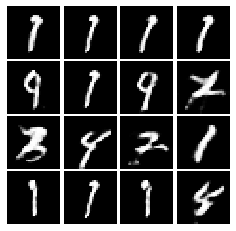

Epoch: 4, Iter: 2080, D: 0.6091, G:2.088


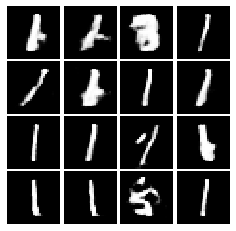

Epoch: 4, Iter: 2100, D: 0.496, G:2.157


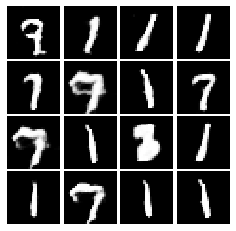

Epoch: 4, Iter: 2120, D: 0.6096, G:1.82


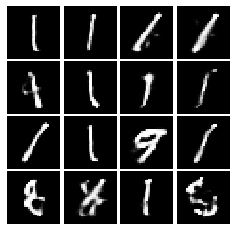

Epoch: 4, Iter: 2140, D: 0.7046, G:2.86


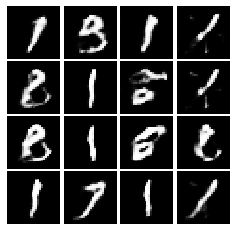

Epoch: 4, Iter: 2160, D: 0.6769, G:1.966


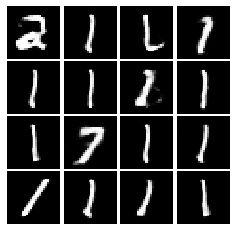

Epoch: 4, Iter: 2180, D: 0.4205, G:2.016


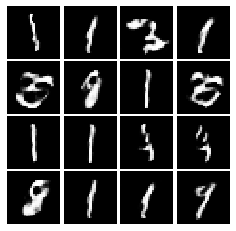

Epoch: 4, Iter: 2200, D: 0.4698, G:2.154


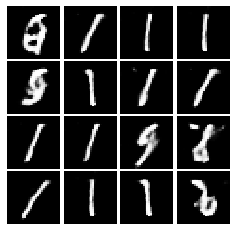

Epoch: 4, Iter: 2220, D: 0.572, G:1.891


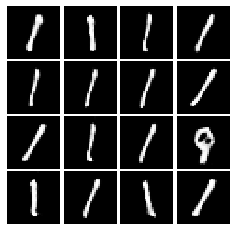

Epoch: 4, Iter: 2240, D: 0.5759, G:2.306


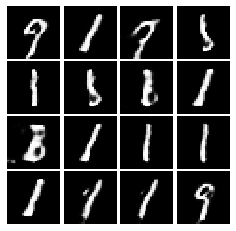

Epoch: 4, Iter: 2260, D: 0.3774, G:2.819


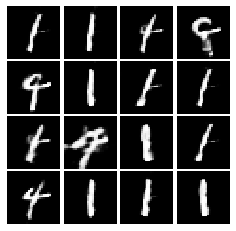

Epoch: 4, Iter: 2280, D: 0.5928, G:2.607


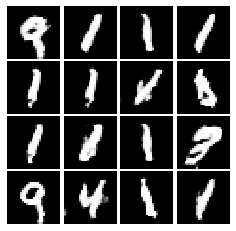

Epoch: 4, Iter: 2300, D: 0.4802, G:1.879


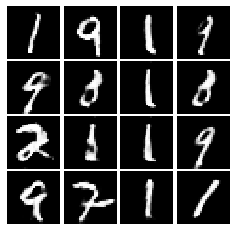

Epoch: 4, Iter: 2320, D: 0.4144, G:2.349


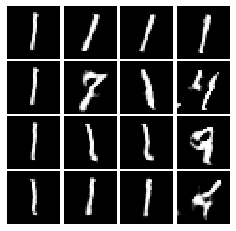

Epoch: 4, Iter: 2340, D: 0.45, G:2.299


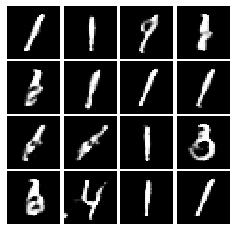

Final images


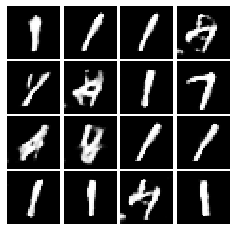

In [23]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)